# Data_Pre_Processing

In [ ]:
!pip install PublicDataReader
!pip install PublicDataReader --upgrade
!pip install finance-datareader
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import FinanceDataReader as fdr
import PublicDataReader as pdr
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings(action='ignore')
plt.rc('font', family='NanumBarunGothic') 
mpl.rc('axes', unicode_minus=False)
plt.rcParams["font.family"] = 'nanummyeongjo'
plt.rcParams["axes.grid"] = True
plt.rcParams["figure.figsize"] = (12,6)
plt.rcParams["axes.formatter.useoffset"] = False
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["axes.formatter.limits"] = -10000, 10000
sns.set(rc={'font.family':'NanumBarunGothic'})
%matplotlib inline
%config InlineBackend.figure_format='retina'

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 37 not upgraded.
Need to get 9,604 kB of archives.
After this operation, 29.5 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-nanum all 20170925-1 [9,604 kB]
Fetched 9,604 kB in 0s (48.2 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 155047 files and di

## 부동산

In [ ]:
# 공공 데이터 포털에서 발급 받은 서비스 인증키
serviceKey1="hGlBCNSeR7TxS%2BU%2Bu%2BifNpy8dqKPkW0rbEGPR3oibVY0Yq4900BlQts5m9%2FreDtQaxt3y5xX%2B7HnU4OwGgTwLg%3D%3D"
serviceKey2="kI3eyBosh2N2Y315GFPeqB%2Fa3IdHD6DnJ2ePc%2F0nbhu313OqPgwn%2FGGdTrCkzWa9a7ejEXJrDBxhn9c5zOifRw%3D%3D"

# 국토교통부 실거래가 Open API 인스턴스 생성
molit = pdr.Transaction(serviceKey1)

# 지역코드 조회
codeResult = molit.CodeFinder('서울특별시')
inSeoul = codeResult['법정구코드'].unique()

# 테스트
df_sum = molit.DataCollector(molit.AptTrade, inSeoul[1], 201801, 201803) 
df_sum

>>> 아파트매매 실거래자료 조회 서비스가 정상 작동합니다.
>>> 아파트매매 실거래 상세 자료 조회 서비스키 미등록 오류입니다.
>>> 아파트 전월세 자료 조회 서비스키 미등록 오류입니다.
>>> 아파트 분양권전매 신고 자료 조회 서비스키 미등록 오류입니다.
>>> 오피스텔 매매 신고 조회 서비스키 미등록 오류입니다.
>>> 오피스텔 전월세 신고 조회 서비스키 미등록 오류입니다.
>>> 연립다세대 매매 실거래자료 조회 서비스키 미등록 오류입니다.
>>> 연립다세대 전월세 실거래자료 조회 서비스키 미등록 오류입니다.
>>> 단독/다가구 매매 실거래 조회 서비스키 미등록 오류입니다.
>>> 단독/다가구 전월세 자료 조회 서비스키 미등록 오류입니다.
>>> 토지 매매 신고 조회 서비스키 미등록 오류입니다.
>>> 상업업무용 부동산 매매 신고 자료 조회 서비스키 미등록 오류입니다.
>>> LAWD_CD : 11110 DEAL_YMD : 201801
>>> LAWD_CD : 11110 DEAL_YMD : 201802
>>> LAWD_CD : 11110 DEAL_YMD : 201803


,지역코드,법정동,거래일,아파트,지번,전용면적,층,건축년도,거래금액
0,11110,내수동,2018-01-13,경희궁의아침2단지,71,140.780,15,2004,130000
1,11110,내수동,2018-01-19,경희궁 파크팰리스,95,103.770,5,2003,96000
2,11110,내수동,2018-01-23,경희궁의아침3단지,72,123.130,10,2004,118000
3,11110,내수동,2018-01-30,세종로대우,167,66.960,13,1994,54500
4,11110,내수동,2018-01-31,세종로대우,167,76.660,11,1994,64000
...,...,...,...,...,...,...,...,...,...
245,11110,평창동,2018-03-20,롯데낙천대,72,110.530,9,2001,71200
246,11110,평창동,2018-03-24,롯데낙천대,72,84.210,6,2001,57000
247,11110,평창동,2018-03-26,크래스빌,46-1,187.900,5,2003,80000
248,11110,평창동,2018-03-28,삼성,596,84.930,5,1998,44000


In [ ]:
# 서울시 데이터프레임 만들기
df_new = pd.DataFrame()
for gu in inSeoul :
  df_new = pd.concat([df_new,molit.DataCollector(molit.AptTrade, gu, 201801, 202102)],axis=0) 

>>> LAWD_CD : 11000 DEAL_YMD : 201801
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201802
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201803
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201804
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201805
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201806
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201807
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201808
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201809
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201810
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201811
>>> Python Logic Error. e-mail : wooil@kakao.com
>>> LAWD_CD : 11000 DEAL_YMD : 201812
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201901
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201902
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201903
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201904
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201905
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD : 201906
조회할 자료가 없습니다.
>>> LAWD_CD : 11000 DEAL_YMD 

In [ ]:
df_new.to_csv('house_price.csv')
df_new['거래일'] = pd.to_datetime(df_new['거래일'].astype(str))
df_new['거래년도'] = df_new['거래일'].dt.year
df_new['거래년월'] = df_new['거래일'].dt.year.astype(str)+"-"+df_new['거래일'].dt.month.astype(str)
df_new.sort_values(by='거래일')

,지역코드,법정동,거래일,아파트,지번,전용면적,층,건축년도,거래금액,거래년도,거래년월
133,11380,신사동,2018-01-01,현대2,355,84.830,9,1994,35700,2018,2018-1
2,11530,개봉동,2018-01-01,현대홈타운,480,115.000,15,2001,51400,2018,2018-1
132,11200,마장동,2018-01-01,세림,784,84.930,1,1986,71000,2018,2018-1
555,11680,역삼동,2018-01-01,세방하이빌1,771-4,59.770,5,2003,80000,2018,2018-1
926,11710,풍납동,2018-01-01,연지토성,400-5,57.880,5,2000,39500,2018,2018-1
...,...,...,...,...,...,...,...,...,...,...,...
13554,11290,장위동,2021-02-28,꿈의숲대명루첸아파트,317,103.526,1,2008,99000,2021,2021-2
13580,11530,고척동,2021-02-28,한일유앤아이,337,84.980,4,2005,68800,2021,2021-2
15351,11710,가락동,2021-02-28,우성,96-1,58.460,13,1986,110000,2021,2021-2
15083,11500,가양동,2021-02-28,가양6단지,1485,39.600,15,1992,64000,2021,2021-2


In [ ]:
code_num = pd.read_csv('/content/법정동코드 전체자료.txt', sep='\t', encoding='utf-8')
ind_num = []
i = 0
for gu in code_num.법정동코드:
  for do in df_new.지역코드.unique()*100000:
    if gu == do:
      ind_num.append(i)
  i +=1
ind_num

[1,
 94,
 179,
 229,
 332,
 342,
 399,
 422,
 503,
 508,
 548,
 573,
 597,
 673,
 716,
 737,
 765,
 806,
 810,
 913,
 937,
 975,
 1003,
 1072,
 1087]

In [ ]:
area_name = code_num.iloc[ind_num]

In [ ]:
area_name['구명']=[b for a,b in area_name['법정동명'].str.split(" ")]
area_name

,법정동코드,법정동명,폐지여부,구명
1,1111000000,서울특별시 종로구,존재,종로구
94,1114000000,서울특별시 중구,존재,중구
179,1117000000,서울특별시 용산구,존재,용산구
229,1120000000,서울특별시 성동구,존재,성동구
332,1121500000,서울특별시 광진구,존재,광진구
342,1123000000,서울특별시 동대문구,존재,동대문구
399,1126000000,서울특별시 중랑구,존재,중랑구
422,1129000000,서울특별시 성북구,존재,성북구
503,1130500000,서울특별시 강북구,존재,강북구
508,1132000000,서울특별시 도봉구,존재,도봉구


In [ ]:
code_change = {int(a/100000):b for a,b in zip(area_name.법정동코드,area_name.구명)}
code_change

{11110: '종로구',
 11140: '중구',
 11170: '용산구',
 11200: '성동구',
 11215: '광진구',
 11230: '동대문구',
 11260: '중랑구',
 11290: '성북구',
 11305: '강북구',
 11320: '도봉구',
 11350: '노원구',
 11380: '은평구',
 11410: '서대문구',
 11440: '마포구',
 11470: '양천구',
 11500: '강서구',
 11530: '구로구',
 11545: '금천구',
 11560: '영등포구',
 11590: '동작구',
 11620: '관악구',
 11650: '서초구',
 11680: '강남구',
 11710: '송파구',
 11740: '강동구'}

In [ ]:
df_new.지역코드 = df_new.지역코드.replace(code_change)
df_new

,지역코드,법정동,거래일,아파트,지번,전용면적,층,건축년도,거래금액,거래년도,거래년월
0,종로구,내수동,2018-01-13,경희궁의아침2단지,71,140.78,15,2004,130000,2018,2018-1
1,종로구,내수동,2018-01-19,경희궁 파크팰리스,95,103.77,5,2003,96000,2018,2018-1
2,종로구,내수동,2018-01-23,경희궁의아침3단지,72,123.13,10,2004,118000,2018,2018-1
3,종로구,내수동,2018-01-30,세종로대우,167,66.96,13,1994,54500,2018,2018-1
4,종로구,내수동,2018-01-31,세종로대우,167,76.66,11,1994,64000,2018,2018-1
...,...,...,...,...,...,...,...,...,...,...,...
11453,강동구,천호동,2020-10-31,SM이로빌아파트,52-3,84.77,5,2004,59500,2020,2020-10
11454,강동구,천호동,2020-10-31,우성,19-1,64.53,4,1985,85000,2020,2020-10
11455,강동구,천호동,2020-10-31,래미안강동팰리스,571,84.97,7,2017,131000,2020,2020-10
11456,강동구,천호동,2020-10-31,래미안강동팰리스,571,84.97,20,2017,139500,2020,2020-10


## 주식/선물

In [ ]:
"""
KS11 : 코스피지수
KQ11 : 코스닥지수
DJI : 다우존스
IXIC : 나스닥
VIX : 뉴욕주식시장
CSI : CSI 300은 상하이 증권 거래소와 심천 증권 거래소에서 거래되는 상위 300 개 주식의 성과
SSEC : 상해
DE30 : 독일
FCHI : 프랑스
"""

KOREA = ['KS11', 'KQ11']
USA = ['DJI','IXIC','VIX']
WORLD = ['CSI300','SSEC','DE30','FCHI']
FUTURES = ['NG','GC','HG','CL']
FOREIGN = USA + WORLD + FUTURES

In [ ]:
al_idx = fdr.DataReader('KS11', '2018', '2022').index

stock_kr = pd.DataFrame(index=al_idx)
for kr in KOREA :
  stock_kr[kr] =  fdr.DataReader(kr, '2018', '2022')["Close"]
stock_kr.head()

,KS11,KQ11
Date,,
2018-01-02,2479.65,812.45
2018-01-03,2486.35,822.31
2018-01-04,2466.46,808.01
2018-01-05,2497.52,828.03
2018-01-08,2513.28,839.51


In [ ]:
# 한국 개장일을 기준으로 주식/선물 지표 데이터프레임화

stock_for = pd.DataFrame(index=al_idx)
for fo in FOREIGN :
  stock_for[fo] =  fdr.DataReader(fo, '2018', '2022')["Close"]
stock_for.head()

,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL
Date,,,,,,,,,,,
2018-01-02,24824.01,7006.9,9.77,4087.40,3348.33,12871.39,5288.60,3.056,33.65,3.3630,75.14
2018-01-03,24922.68,7065.5,9.15,4111.39,3369.11,12978.21,5331.28,3.008,33.83,3.3500,74.85
2018-01-04,25075.13,7077.9,9.22,4128.81,3385.71,13167.89,5413.69,2.880,33.80,3.3565,75.33
2018-01-05,25295.87,7136.6,9.22,4138.75,3391.75,13319.64,5470.75,2.795,33.86,3.3275,75.42
2018-01-08,25283.00,7157.4,9.52,4160.16,3409.48,13367.78,5487.42,2.835,33.88,3.3225,75.53


In [ ]:
df=pd.concat([stock_kr,stock_for],axis=1)
df.head(10)

,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL
Date,,,,,,,,,,,,,
2018-01-02,2479.65,812.45,24824.01,7006.9,9.77,4087.40,3348.33,12871.39,5288.60,3.056,33.65,3.3630,75.14
2018-01-03,2486.35,822.31,24922.68,7065.5,9.15,4111.39,3369.11,12978.21,5331.28,3.008,33.83,3.3500,74.85
2018-01-04,2466.46,808.01,25075.13,7077.9,9.22,4128.81,3385.71,13167.89,5413.69,2.880,33.80,3.3565,75.33
2018-01-05,2497.52,828.03,25295.87,7136.6,9.22,4138.75,3391.75,13319.64,5470.75,2.795,33.86,3.3275,75.42
2018-01-08,2513.28,839.51,25283.00,7157.4,9.52,4160.16,3409.48,13367.78,5487.42,2.835,33.88,3.3225,75.53
2018-01-09,2510.23,829.99,25385.80,7163.6,10.08,4189.30,3413.90,13385.59,5523.94,2.923,33.68,3.3155,75.64
2018-01-10,2499.75,834.91,25369.13,7153.6,9.82,4207.81,3421.83,13281.34,5504.68,2.906,33.62,3.3340,74.82
2018-01-11,2487.91,852.51,25574.73,7211.8,9.88,4205.59,3425.34,13202.90,5488.55,3.084,33.28,3.3365,74.55
2018-01-12,2496.42,873.05,25803.19,7261.1,10.16,4225.00,3428.94,13245.03,5517.06,3.200,33.44,3.3250,74.62


In [ ]:
df_stock = df.ffill()
df_stock.head(10)

,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL
Date,,,,,,,,,,,,,
2018-01-02,2479.65,812.45,24824.01,7006.9,9.77,4087.40,3348.33,12871.39,5288.60,3.056,33.65,3.3630,75.14
2018-01-03,2486.35,822.31,24922.68,7065.5,9.15,4111.39,3369.11,12978.21,5331.28,3.008,33.83,3.3500,74.85
2018-01-04,2466.46,808.01,25075.13,7077.9,9.22,4128.81,3385.71,13167.89,5413.69,2.880,33.80,3.3565,75.33
2018-01-05,2497.52,828.03,25295.87,7136.6,9.22,4138.75,3391.75,13319.64,5470.75,2.795,33.86,3.3275,75.42
2018-01-08,2513.28,839.51,25283.00,7157.4,9.52,4160.16,3409.48,13367.78,5487.42,2.835,33.88,3.3225,75.53
2018-01-09,2510.23,829.99,25385.80,7163.6,10.08,4189.30,3413.90,13385.59,5523.94,2.923,33.68,3.3155,75.64
2018-01-10,2499.75,834.91,25369.13,7153.6,9.82,4207.81,3421.83,13281.34,5504.68,2.906,33.62,3.3340,74.82
2018-01-11,2487.91,852.51,25574.73,7211.8,9.88,4205.59,3425.34,13202.90,5488.55,3.084,33.28,3.3365,74.55
2018-01-12,2496.42,873.05,25803.19,7261.1,10.16,4225.00,3428.94,13245.03,5517.06,3.200,33.44,3.3250,74.62


In [ ]:
df_stock = df_stock[df_stock.index<='2021-02']
df_stock.sort_values(by='Date')

,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL
Date,,,,,,,,,,,,,
2018-01-02,2479.65,812.45,24824.01,7006.9,9.77,4087.40,3348.33,12871.39,5288.60,3.056,33.65,3.3630,75.14
2018-01-03,2486.35,822.31,24922.68,7065.5,9.15,4111.39,3369.11,12978.21,5331.28,3.008,33.83,3.3500,74.85
2018-01-04,2466.46,808.01,25075.13,7077.9,9.22,4128.81,3385.71,13167.89,5413.69,2.880,33.80,3.3565,75.33
2018-01-05,2497.52,828.03,25295.87,7136.6,9.22,4138.75,3391.75,13319.64,5470.75,2.795,33.86,3.3275,75.42
2018-01-08,2513.28,839.51,25283.00,7157.4,9.52,4160.16,3409.48,13367.78,5487.42,2.835,33.88,3.3225,75.53
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-26,3140.31,994.00,30937.04,13626.1,23.02,5512.97,3569.43,13870.99,5523.52,2.656,42.89,3.6285,78.75
2021-01-27,3122.56,985.92,30303.17,13270.6,37.21,5528.00,3573.34,13620.46,5459.62,2.760,42.58,3.5670,78.03
2021-01-28,3069.05,961.23,30603.36,13337.2,30.21,5377.14,3505.18,13665.93,5510.52,2.664,42.81,3.5755,79.15


In [ ]:
df_stock.reset_index().Date.dt.year.astype(str)+"-"+df_stock.reset_index().Date.dt.month.astype(str)

0      2018-1
1      2018-1
2      2018-1
3      2018-1
4      2018-1
        ...  
754    2021-1
755    2021-1
756    2021-1
757    2021-1
758    2021-2
Name: Date, Length: 759, dtype: object

In [ ]:
df_stock = df_stock.reset_index()
df_stock['년월'] = df_stock.reset_index().Date.dt.year.astype(str)+"-"+df_stock.reset_index().Date.dt.month.astype(str)
df_stock = df_stock.set_index('Date')
df_stock

,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,년월
Date,,,,,,,,,,,,,,
2018-01-02,2479.65,812.45,24824.01,7006.9,9.77,4087.40,3348.33,12871.39,5288.60,3.056,33.65,3.3630,75.14,2018-1
2018-01-03,2486.35,822.31,24922.68,7065.5,9.15,4111.39,3369.11,12978.21,5331.28,3.008,33.83,3.3500,74.85,2018-1
2018-01-04,2466.46,808.01,25075.13,7077.9,9.22,4128.81,3385.71,13167.89,5413.69,2.880,33.80,3.3565,75.33,2018-1
2018-01-05,2497.52,828.03,25295.87,7136.6,9.22,4138.75,3391.75,13319.64,5470.75,2.795,33.86,3.3275,75.42,2018-1
2018-01-08,2513.28,839.51,25283.00,7157.4,9.52,4160.16,3409.48,13367.78,5487.42,2.835,33.88,3.3225,75.53,2018-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-26,3140.31,994.00,30937.04,13626.1,23.02,5512.97,3569.43,13870.99,5523.52,2.656,42.89,3.6285,78.75,2021-1
2021-01-27,3122.56,985.92,30303.17,13270.6,37.21,5528.00,3573.34,13620.46,5459.62,2.760,42.58,3.5670,78.03,2021-1
2021-01-28,3069.05,961.23,30603.36,13337.2,30.21,5377.14,3505.18,13665.93,5510.52,2.664,42.81,3.5755,79.15,2021-1


In [ ]:
df_stock_group = df_stock.groupby('년월').mean()
df_stock_group

,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL
년월,,,,,,,,,,,,,
2018-1,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182
2018-10,2153.476667,724.950476,25512.185714,7493.314286,19.882857,3214.219524,2638.078095,11643.934286,5147.778095,3.204143,43.770952,2.849405,63.177619
2018-11,2083.333182,687.782727,25222.585000,7224.109091,19.453182,3208.547727,2630.995909,11359.625000,5035.077727,4.109636,49.672727,2.814659,62.024091
2018-12,2070.128947,676.494737,23894.998421,6841.821053,24.706842,3132.823684,2577.328421,10813.415789,4792.716842,3.977105,48.669474,2.766184,62.356316
2018-2,2439.104444,863.640000,24951.283333,7151.200000,22.638889,4047.877778,3280.151667,12466.063889,5258.445000,2.668556,34.428333,3.292833,70.189444
2018-3,2451.570000,867.919524,24558.081429,7305.919048,18.904762,4015.990476,3246.515714,12161.452857,5196.082857,2.701048,34.219048,3.198929,69.967143
2018-4,2458.224762,879.889524,24304.212857,7084.138095,18.267619,3828.878095,3122.914762,12396.603810,5336.841905,2.724238,34.852381,3.236190,69.767619
2018-5,2461.300500,863.840500,24602.901000,7356.235000,14.025000,3846.167500,3144.294500,12904.703500,5532.814500,2.836650,47.343000,3.208375,62.792000
2018-6,2394.507895,850.598421,24749.720000,7640.157895,13.824211,3677.056316,2969.378947,12647.262632,5403.364211,2.943895,51.702105,3.236658,63.860000


##외국인 증권투자

In [ ]:
# 외국인 증권 투자 현황

df_fori = pd.read_excel('/content/외국인증권.xls')
df_fori.columns = df_fori.iloc[1]
df_fori = df_fori.iloc[[2]].T.iloc[2:]
df_fori.columns = ['외국인증권투자']
df_fori

,외국인증권투자
1,
201801월,657.7
201802월,621.1
201803월,625.2
201804월,643.8
201805월,623.9
201806월,596.9
201807월,592.7
201808월,599.8
201809월,597.0


In [ ]:
df_fori['년월'] = index_list
df_fori = df_fori.set_index('년월',drop=True)
df_fori

,외국인증권투자
년월,
2018-01,657.7
2018-02,621.1
2018-03,625.2
2018-04,643.8
2018-05,623.9
2018-06,596.9
2018-07,592.7
2018-08,599.8
2018-09,597.0


##자치구별 인구

In [ ]:
df_pop = pd.read_csv('/content/서울시인구.txt', sep='\t')[['기간','자치구','세대','인구','세대당인구']]
df_pop = df_pop.iloc[2:]
df_pop = df_pop[df_pop['자치구']!='합계']
df_pop.sort_values(by='기간')

,기간,자치구,세대,인구,세대당인구
3,2018.1/4,종로구,"73,879","164,348",2.09
27,2018.1/4,강동구,"177,490","438,225",2.45
26,2018.1/4,송파구,"266,550","671,994",2.5
25,2018.1/4,강남구,"231,219","557,865",2.39
24,2018.1/4,서초구,"174,225","445,164",2.53
...,...,...,...,...,...
316,2021.1/4,중구,"63,746","133,708",1.95
315,2021.1/4,종로구,"74,113","156,567",1.99
338,2021.1/4,송파구,"280,237","667,115",2.36
326,2021.1/4,은평구,"212,725","479,607",2.24


In [ ]:
quan_list1 = []
quan_list2 = []
quan_list3 = []
for rep1,rep2 in df_pop.기간.str.split('.'):
  if rep2 == '1/4':
    quan_list1.append(str(rep1+'.'+'01'))
    quan_list2.append(str(rep1+'.'+'02'))
    quan_list3.append(str(rep1+'.'+'03'))
  elif rep2 == '2/4':
    quan_list1.append(str(rep1+'.'+'04'))
    quan_list2.append(str(rep1+'.'+'05'))
    quan_list3.append(str(rep1+'.'+'06'))
  elif rep2 == '3/4':
    quan_list1.append(str(rep1+'.'+'07'))
    quan_list2.append(str(rep1+'.'+'08'))
    quan_list3.append(str(rep1+'.'+'09'))
  elif rep2 == '4/4':
    quan_list1.append(str(rep1+'.'+'10'))
    quan_list2.append(str(rep1+'.'+'11'))
    quan_list3.append(str(rep1+'.'+'12'))

In [ ]:
df_pop1 = df_pop.copy().drop(columns='기간')
df_pop2 = df_pop.copy().drop(columns='기간')
df_pop3 = df_pop.copy().drop(columns='기간')
df_pop1['기간'] = quan_list1
df_pop2['기간'] = quan_list2
df_pop3['기간'] = quan_list3

In [ ]:
df_pop1_concat = df_pop1.set_index(['기간','자치구'])
df_pop2_concat = df_pop2.set_index(['기간','자치구'])
df_pop3_concat = df_pop3.set_index(['기간','자치구'])

In [ ]:
df_pop_concat = pd.concat([df_pop1_concat,df_pop2_concat,df_pop3_concat])

In [ ]:
df_pop_last = df_pop_concat[:-25]

In [ ]:
# appen1 = df_pop_concat[-25:].copy().reset_index()
# appen2 = df_pop_concat[-25:].copy().reset_index()
# appen3 = df_pop_concat[-25:].copy().reset_index()

In [ ]:
# appen1.기간 = appen1.기간.replace('2021.03','2020.12')
# appen2.기간 = appen2.기간.replace('2021.03','2021.01')
# appen3.기간 = appen3.기간.replace('2021.03','2021.02')
# appen1 = appen1.set_index(['기간','자치구'])
# appen2 = appen2.set_index(['기간','자치구'])
# appen3 = appen3.set_index(['기간','자치구'])
# df_pop_last = pd.concat([df_pop_concat,appen1,appen2,appen3])

## 전입인구

In [ ]:
df_come = pd.read_csv('/content/인구이동.txt',sep='\t')[['기간','인구이동(전입지별)']].iloc[2:]
df_come['년월'] = df_come['기간'].str.replace('.','-')
df_come = df_come.set_index('년월')
df_come = df_come[['인구이동(전입지별)']]
df_come = df_come[:-5]
df_come

,인구이동(전입지별)
년월,
2018-01,"119,120"
2018-02,"135,440"
2018-03,"144,160"
2018-04,"117,443"
2018-05,"117,278"
2018-06,"109,139"
2018-07,"112,580"
2018-08,"117,300"
2018-09,"92,262"


In [ ]:
# index 생성 

index_list = [x for x in df_come.index]
index_list

['2018-01',
 '2018-02',
 '2018-03',
 '2018-04',
 '2018-05',
 '2018-06',
 '2018-07',
 '2018-08',
 '2018-09',
 '2018-10',
 '2018-11',
 '2018-12',
 '2019-01',
 '2019-02',
 '2019-03',
 '2019-04',
 '2019-05',
 '2019-06',
 '2019-07',
 '2019-08',
 '2019-09',
 '2019-10',
 '2019-11',
 '2019-12',
 '2020-01',
 '2020-02',
 '2020-03',
 '2020-04',
 '2020-05',
 '2020-06',
 '2020-07',
 '2020-08',
 '2020-09',
 '2020-10',
 '2020-11',
 '2020-12',
 '2021-01',
 '2021-02']

## 시장금리

In [ ]:
df_int = pd.read_excel('/content/시장금리.xls')
df_int.columns = df_int.iloc[1]
df_int = df_int.iloc[2:8].T
df_int.columns = df_int.iloc[0]
df_int = df_int.iloc[1:]
df_int

nan,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)"
1,,,,,,
201801월,2.19,2.44,2.63,2.72,1.66,1.49
201802월,2.28,2.54,2.77,2.82,1.65,1.49
201803월,2.27,2.50,2.71,2.83,1.65,1.49
201804월,2.19,2.44,2.66,2.79,1.65,1.47
201805월,2.25,2.53,2.76,2.86,1.65,1.50
201806월,2.18,2.44,2.66,2.81,1.65,1.49
201807월,2.10,2.34,2.55,2.75,1.65,1.49
201808월,2.02,2.24,2.46,2.66,1.65,1.50
201809월,1.95,2.13,2.32,2.40,1.65,1.54


In [ ]:
df_int.index = index_list
df_int

nan,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)"
2018-01,2.19,2.44,2.63,2.72,1.66,1.49
2018-02,2.28,2.54,2.77,2.82,1.65,1.49
2018-03,2.27,2.50,2.71,2.83,1.65,1.49
2018-04,2.19,2.44,2.66,2.79,1.65,1.47
2018-05,2.25,2.53,2.76,2.86,1.65,1.50
2018-06,2.18,2.44,2.66,2.81,1.65,1.49
2018-07,2.10,2.34,2.55,2.75,1.65,1.49
2018-08,2.02,2.24,2.46,2.66,1.65,1.50
2018-09,1.95,2.13,2.32,2.40,1.65,1.54
2018-10,2.01,2.16,2.34,2.45,1.68,1.52


## 소비자물가지수

In [ ]:
df_ind = pd.read_excel('/content/소비자물가.xls')
df_ind.columns = df_ind.iloc[1]
df_ind = df_ind.iloc[2:9].T
df_ind.columns = df_ind.iloc[0]
df_ind = df_ind.iloc[1:]
df_ind

nan,소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가
1,,,,,,,
201801월,0.8,-1.8,0.8,1.1,0.5,1.7,0.9
201802월,1.3,2.8,0.6,1.0,0.4,2.3,1.1
201803월,1.2,1.2,0.8,0.9,0.4,2.6,1.3
201804월,1.5,3.5,1.3,0.8,0.3,2.6,1.4
201805월,1.5,1.7,1.5,0.6,0.2,2.8,1.3
201806월,1.5,0.9,1.6,0.6,0.3,2.8,1.2
201807월,1.1,1.2,1.8,0.5,0.1,2.4,0.8
201808월,1.4,4.6,1.8,0.5,0.0,2.5,0.9
201809월,2.1,8.6,1.8,0.4,0.0,2.7,1.3


In [ ]:
df_ind.index = index_list
df_ind

nan,소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가
2018-01,0.8,-1.8,0.8,1.1,0.5,1.7,0.9
2018-02,1.3,2.8,0.6,1.0,0.4,2.3,1.1
2018-03,1.2,1.2,0.8,0.9,0.4,2.6,1.3
2018-04,1.5,3.5,1.3,0.8,0.3,2.6,1.4
2018-05,1.5,1.7,1.5,0.6,0.2,2.8,1.3
2018-06,1.5,0.9,1.6,0.6,0.3,2.8,1.2
2018-07,1.1,1.2,1.8,0.5,0.1,2.4,0.8
2018-08,1.4,4.6,1.8,0.5,0.0,2.5,0.9
2018-09,2.1,8.6,1.8,0.4,0.0,2.7,1.3
2018-10,2.0,8.5,1.8,0.4,0.1,2.5,1.2


## GDP

In [ ]:
df_gdp =  pd.read_excel('/content/GDP.xls')
df_gdp.columns = df_gdp.iloc[1]
df_gdp = df_gdp.iloc[[2,3]]
df_gdp = df_gdp.T
df_gdp.columns = df_gdp.iloc[0]
df_gdp = df_gdp.iloc[1:]
df_gdp.columns.name = ''
df_gdp.index.name = ''
df_gdp = df_gdp[:-1]
df_gdp

,국내총생산(명목GDP),경제성장률(실질GDP성장률)
,,
20181/4,"449,838.1",3.0
20182/4,"473,018.3",3.1
20183/4,"485,535.7",2.4
20184/4,"489,800.5",3.1
20191/4,"454,891.0",1.8
20192/4,"479,907.0",2.1
20193/4,"487,177.0",2.0
20194/4,"497,064.8",2.3
20201/4,"458,202.4",-1.3


In [ ]:
quan_list1 = []
quan_list2 = []
quan_list3 = []
for i in df_gdp.index:
  rep1 = i[:4]
  rep2 = i[4:]
  if rep2 == '1/4':
    quan_list1.append(str(rep1+'-'+'01'))
    quan_list2.append(str(rep1+'-'+'02'))
    quan_list3.append(str(rep1+'-'+'03'))
  elif rep2 == '2/4' :
    quan_list1.append(str(rep1+'-'+'04'))
    quan_list2.append(str(rep1+'-'+'05'))
    quan_list3.append(str(rep1+'-'+'06'))
  elif rep2 == '3/4' :
    quan_list1.append(str(rep1+'-'+'07'))
    quan_list2.append(str(rep1+'-'+'08'))
    quan_list3.append(str(rep1+'-'+'09'))
  elif rep2 == '4/4' :
    quan_list1.append(str(rep1+'-'+'10'))
    quan_list2.append(str(rep1+'-'+'11'))
    quan_list3.append(str(rep1+'-'+'12'))

In [ ]:
df_gdp1 = df_gdp.copy().reset_index(drop=True)
df_gdp2 = df_gdp.copy().reset_index(drop=True)
df_gdp3 = df_gdp.copy().reset_index(drop=True)
df_gdp1['기간'] = quan_list1
df_gdp2['기간'] = quan_list2
df_gdp3['기간'] = quan_list3

In [ ]:
df_gdp1_concat = df_gdp1.set_index(['기간'])
df_gdp2_concat = df_gdp2.set_index(['기간'])
df_gdp3_concat = df_gdp3.set_index(['기간'])

In [ ]:
df_gdp_concat = pd.concat([df_gdp1_concat,df_gdp2_concat,df_gdp3_concat])
df_gdp_concat

,국내총생산(명목GDP),경제성장률(실질GDP성장률)
기간,,
2018-01,"449,838.1",3.0
2018-04,"473,018.3",3.1
2018-07,"485,535.7",2.4
2018-10,"489,800.5",3.1
2019-01,"454,891.0",1.8
2019-04,"479,907.0",2.1
2019-07,"487,177.0",2.0
2019-10,"497,064.8",2.3
2020-01,"458,202.4",-1.3


In [ ]:
df_gdp_last = df_gdp_concat[:-1]
df_gdp_last

,국내총생산(명목GDP),경제성장률(실질GDP성장률)
기간,,
2018-01,"449,838.1",3.0
2018-04,"473,018.3",3.1
2018-07,"485,535.7",2.4
2018-10,"489,800.5",3.1
2019-01,"454,891.0",1.8
2019-04,"479,907.0",2.1
2019-07,"487,177.0",2.0
2019-10,"497,064.8",2.3
2020-01,"458,202.4",-1.3


## 자동차등록

In [ ]:
df_car =  pd.read_csv('/content/자동차등록.txt',sep='\t')[['기간','자치구','합계']]
df_car = df_car.iloc[1:]
df_car = df_car[df_car['자치구']!='기타']
df_car

,기간,자치구,합계
1,2018.01,서울시,"3,118,469"
2,2018.01,종로구,"50,745"
3,2018.01,중구,"51,548"
4,2018.01,용산구,"77,635"
5,2018.01,성동구,"103,282"
...,...,...,...
1021,2021.02,관악구,"119,058"
1022,2021.02,서초구,"179,188"
1023,2021.02,강남구,"236,015"
1024,2021.02,송파구,"245,567"


In [ ]:
df_car_to_concat = df_car.set_index(['기간','자치구'])
df_car_to_concat.columns=['자동차등록']

##Concat

In [ ]:
df_stock_group.index = index_list

In [ ]:
df_21 = pd.concat([df_come,df_fori,df_int,df_ind, df_stock_group, df_gdp_last],axis=1)
df_21 = df_21.ffill()
df_21

,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률)
2018-01,"119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,"449,838.1",3.0
2018-02,"135,440",621.1,2.28,2.54,2.77,2.82,1.65,1.49,1.3,2.8,0.6,1.0,0.4,2.3,1.1,2153.476667,724.950476,25512.185714,7493.314286,19.882857,3214.219524,2638.078095,11643.934286,5147.778095,3.204143,43.770952,2.849405,63.177619,"449,838.1",3.0
2018-03,"144,160",625.2,2.27,2.50,2.71,2.83,1.65,1.49,1.2,1.2,0.8,0.9,0.4,2.6,1.3,2083.333182,687.782727,25222.585000,7224.109091,19.453182,3208.547727,2630.995909,11359.625000,5035.077727,4.109636,49.672727,2.814659,62.024091,"449,838.1",3.0
2018-04,"117,443",643.8,2.19,2.44,2.66,2.79,1.65,1.47,1.5,3.5,1.3,0.8,0.3,2.6,1.4,2070.128947,676.494737,23894.998421,6841.821053,24.706842,3132.823684,2577.328421,10813.415789,4792.716842,3.977105,48.669474,2.766184,62.356316,"473,018.3",3.1
2018-05,"117,278",623.9,2.25,2.53,2.76,2.86,1.65,1.50,1.5,1.7,1.5,0.6,0.2,2.8,1.3,2439.104444,863.640000,24951.283333,7151.200000,22.638889,4047.877778,3280.151667,12466.063889,5258.445000,2.668556,34.428333,3.292833,70.189444,"473,018.3",3.1
2018-06,"109,139",596.9,2.18,2.44,2.66,2.81,1.65,1.49,1.5,0.9,1.6,0.6,0.3,2.8,1.2,2451.570000,867.919524,24558.081429,7305.919048,18.904762,4015.990476,3246.515714,12161.452857,5196.082857,2.701048,34.219048,3.198929,69.967143,"473,018.3",3.1
2018-07,"112,580",592.7,2.10,2.34,2.55,2.75,1.65,1.49,1.1,1.2,1.8,0.5,0.1,2.4,0.8,2458.224762,879.889524,24304.212857,7084.138095,18.267619,3828.878095,3122.914762,12396.603810,5336.841905,2.724238,34.852381,3.236190,69.767619,"485,535.7",2.4
2018-08,"117,300",599.8,2.02,2.24,2.46,2.66,1.65,1.50,1.4,4.6,1.8,0.5,0.0,2.5,0.9,2461.300500,863.840500,24602.901000,7356.235000,14.025000,3846.167500,3144.294500,12904.703500,5532.814500,2.836650,47.343000,3.208375,62.792000,"485,535.7",2.4
2018-09,"92,262",597.0,1.95,2.13,2.32,2.40,1.65,1.54,2.1,8.6,1.8,0.4,0.0,2.7,1.3,2394.507895,850.598421,24749.720000,7640.157895,13.824211,3677.056316,2969.378947,12647.262632,5403.364211,2.943895,51.702105,3.236658,63.860000,"485,535.7",2.4
2018-10,"132,111",524.6,2.01,2.16,2.34,2.45,1.68,1.52,2.0,8.5,1.8,0.4,0.1,2.5,1.2,2284.253636,793.492727,24941.712727,7745.309091,13.283636,3465.726364,2821.059545,12581.671818,5409.368182,2.793000,47.182727,2.929886,65.653182,"489,800.5",3.1


In [ ]:
df_24 = pd.concat([df_pop_last,df_car_to_concat],axis=1)
df_24 = df_24.reset_index()
df_24

,기간,자치구,세대,인구,세대당인구,자동차등록
0,2018.01,강남구,"231,219","557,865",2.39,"238,211"
1,2018.01,강동구,"177,490","438,225",2.45,"136,576"
2,2018.01,강북구,"143,139","327,511",2.26,"77,914"
3,2018.01,강서구,"256,042","608,361",2.35,"202,314"
4,2018.01,관악구,"258,536","522,292",1.95,"122,192"
...,...,...,...,...,...,...
983,2021.02,용산구,"112,881","243,336",2.03,"79,047"
984,2021.02,은평구,"212,725","479,607",2.24,"132,145"
985,2021.02,종로구,"74,113","156,567",1.99,"50,260"
986,2021.02,중구,"63,746","133,708",1.95,"53,206"


In [ ]:
df_24.기간 = df_24.기간.str.replace('.','-')

In [ ]:
df_24 = df_24[df_24.자치구 !='서울시']

In [ ]:
df_24.tail(50)

,기간,자치구,세대,인구,세대당인구,자동차등록
936,2021-01,강남구,"233,363","539,538",2.29,"236,721"
937,2021-01,강동구,"199,088","468,815",2.34,"150,352"
938,2021-01,강북구,"144,410","307,537",2.11,"75,762"
939,2021-01,강서구,"267,442","582,804",2.16,"204,927"
940,2021-01,관악구,"273,736","504,140",1.79,"119,306"
941,2021-01,광진구,"166,638","356,191",2.06,"98,756"
942,2021-01,구로구,"180,027","426,675",2.23,"145,029"
943,2021-01,금천구,"114,402","244,564",2.01,"88,626"
944,2021-01,노원구,"217,272","522,225",2.39,"152,828"
945,2021-01,도봉구,"138,120","323,752",2.33,"95,767"


In [ ]:
df_21_1 = df_21.copy()
df_merge1 = pd.DataFrame(index=df_24.index,columns=df_21_1.columns)
idx_num = 0
for i in df_21_1.index :
  for j in df_24['기간'] :
    if i == j :
      df_merge1.iloc[idx_num] = df_21_1.loc[j]
      idx_num +=1

In [ ]:
df_merge1 = pd.DataFrame(index=df_24.index,columns=df_21_1.columns)
idx_num = 0
for i in df_21_1.index :
  for j in df_24['기간'] :
    if i == j :
      df_merge1.iloc[idx_num] = df_21_1.loc[j]
      idx_num +=1

In [ ]:
df_merge1

,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률)
0,"119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
1,"119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
2,"119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
3,"119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
4,"119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983,"141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7
984,"141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7
985,"141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7
986,"141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7


In [ ]:
df_temp = pd.concat([df_24,df_merge1],axis=1)
df_temp

,기간,자치구,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률)
0,2018-01,강남구,"231,219","557,865",2.39,"238,211","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
1,2018-01,강동구,"177,490","438,225",2.45,"136,576","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
2,2018-01,강북구,"143,139","327,511",2.26,"77,914","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
3,2018-01,강서구,"256,042","608,361",2.35,"202,314","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
4,2018-01,관악구,"258,536","522,292",1.95,"122,192","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983,2021-02,용산구,"112,881","243,336",2.03,"79,047","141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7
984,2021-02,은평구,"212,725","479,607",2.24,"132,145","141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7
985,2021-02,종로구,"74,113","156,567",1.99,"50,260","141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7
986,2021-02,중구,"63,746","133,708",1.95,"53,206","141,936",797.5,1.00,1.35,1.85,2.06,0.73,0.49,1.1,16.2,-0.7,0.9,-2.1,1.6,0.8,3056.53,956.92,30211.9,13403.4,30.24,5417.65,3505.28,13622,5461.68,2.85,42.61,3.5405,78.52,"501,248.1",1.7


In [ ]:
map_for = {x:y for x,y in zip(df_new.거래년월.unique(),df_temp.기간.unique())}

In [ ]:
df_new.거래년월 = df_new.copy().거래년월.replace(map_for)

In [ ]:
df_temp2 = df_temp.set_index(['기간','자치구'])

In [ ]:
print(len(df_new.index))
print(len(df_new['거래년월']))
print(len(df_new['지역코드']))

249742
249742
249742


In [ ]:
df_temp2

세대       인구 세대당인구  ...       CL 국내총생산(명목GDP) 경제성장률(실질GDP성장률)
기간      자치구                          ...                                      
2018-01 강남구  231,219  557,865  2.39  ...  75.5182    449,838.1             3.0
        강동구  177,490  438,225  2.45  ...  75.5182    449,838.1             3.0
        강북구  143,139  327,511  2.26  ...  75.5182    449,838.1             3.0
        강서구  256,042  608,361  2.35  ...  75.5182    449,838.1             3.0
        관악구  258,536  522,292  1.95  ...  75.5182    449,838.1             3.0
...              ...      ...   ...  ...      ...          ...             ...
2021-02 용산구  112,881  243,336  2.03  ...    78.52    501,248.1             1.7
        은평구  212,725  479,607  2.24  ...    78.52    501,248.1             1.7
        종로구   74,113  156,567  1.99  ...    78.52    501,248.1             1.7
        중구    63,746  133,708  1.95  ...    78.52    501,248.1             1.7
        중랑구  185,506  396,807  2.11  ...    78.52    501,248.1             1.7

[950 rows x 34 columns]

In [ ]:
df_merge2 = pd.DataFrame(index=df_new.index,columns=df_temp2.columns)
idx_num = 0
for mon,guu in zip(df_new['거래년월'],df_new['지역코드']) :
  for month,guuuu in df_temp2.index :
    if (mon == month) and (guu==guu):
      df_merge2.iloc[idx_num] = df_temp2.loc[(month,guuuu)]
  idx_num +=1
  if (idx_num%500==0):
    print(idx_num)

500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000
29500
30000
30500
31000
31500
32000
32500
33000
33500
34000
34500
35000
35500
36000
36500
37000
37500
38000
38500
39000
39500
40000
40500
41000
41500
42000
42500
43000
43500
44000
44500
45000
45500
46000
46500
47000
47500
48000
48500
49000
49500
50000
50500
51000
51500
52000
52500
53000
53500
54000
54500
55000
55500
56000
56500
57000
57500
58000
58500
59000
59500
60000
60500
61000
61500
62000
62500
63000
63500
64000
64500
65000
65500
66000
66500
67000
67500
68000
68500
69000
69500
70000
70500
71000
71500
72000
72500
73000
73500
74000
74500
75000
75500
76000
76500
77000
77500
78000
78500
79000
79500
80000
80500
81000
81500
82000
82500
83000
83500
84000
84500
85000


In [ ]:
df_merge2

,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률)
0,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
1,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
2,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
3,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
4,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11453,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1
11454,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1
11455,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1
11456,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1


In [ ]:
df_final = pd.concat([df_new,df_merge2],axis=1)
df_final

,지역코드,법정동,거래일,아파트,지번,전용면적,층,건축년도,거래금액,거래년도,거래년월,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률)
0,종로구,내수동,2018-01-13,경희궁의아침2단지,71,140.78,15,2004,130000,2018,2018-01,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
1,종로구,내수동,2018-01-19,경희궁 파크팰리스,95,103.77,5,2003,96000,2018,2018-01,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
2,종로구,내수동,2018-01-23,경희궁의아침3단지,72,123.13,10,2004,118000,2018,2018-01,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
3,종로구,내수동,2018-01-30,세종로대우,167,66.96,13,1994,54500,2018,2018-01,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
4,종로구,내수동,2018-01-31,세종로대우,167,76.66,11,1994,64000,2018,2018-01,"179,600","411,552",2.27,"114,062","119,120",657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.94,872.453,25804,7278.67,11.0214,4246.93,3457.02,13270.7,5482.95,3.16236,35.0359,3.32043,75.5182,"449,838.1",3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11453,강동구,천호동,2020-10-31,SM이로빌아파트,52-3,84.77,5,2004,59500,2020,2020-10,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1
11454,강동구,천호동,2020-10-31,우성,19-1,64.53,4,1985,85000,2020,2020-10,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1
11455,강동구,천호동,2020-10-31,래미안강동팰리스,571,84.97,7,2017,131000,2020,2020-10,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1
11456,강동구,천호동,2020-10-31,래미안강동팰리스,571,84.97,20,2017,139500,2020,2020-10,"185,920","399,562",2.12,"113,952","126,788",584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.95,781.017,26361.5,10487.2,26.877,4636.31,3288.83,12741,4999.89,1.76361,27.0383,2.91207,74.4887,"492,100.1",1.1


In [ ]:
df_final.to_csv('final_data.csv')

# EDA

In [ ]:
from google.colab import files
files.upload()

Saving final_data.csv to final_data.csv


In [ ]:
df_final = pd.read_csv('final_data.csv')

In [ ]:
df = df_final.copy()
df = df.drop(columns=['거래일', 'Unnamed: 0'])
df.sample(20)

,지역코드,법정동,아파트,지번,전용면적,층,건축년도,거래금액,거래년도,거래년월,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률)
94949,노원구,월계동,미성,13,33.280,3,1986,55000,2020,2020-06,"183,310","399,415",2.15,"112,487","122,292",541.6,0.85,1.13,1.39,2.22,0.79,0.48,0.0,4.6,-1.4,0.2,-2.0,1.0,0.6,1786.746364,549.442273,22637.420909,7772.209091,57.736818,3842.647273,2852.063636,10034.256818,4481.844091,1.731182,28.472273,2.401523,67.302273,"472,328.1",-3.2
214840,강남구,도곡동,도곡우성아파트,934-10,84.830,2,1986,128500,2019,2019-06,"181,383","405,639",2.21,"113,295","91,828",559.8,1.50,1.53,1.62,2.00,1.80,1.76,0.7,1.8,0.0,-0.2,-0.2,1.9,0.9,2161.914500,742.441500,25707.436000,7631.075000,14.531000,3777.843000,3050.953500,11539.637500,5317.811000,2.801950,50.814500,2.941200,66.234500,"479,907.0",2.1
179378,영등포구,당산동5가,삼성래미안,42,133.420,19,2003,150000,2020,2020-01,"182,220","400,678",2.17,"112,714","131,105",581.5,1.37,1.48,1.66,1.96,1.47,1.27,1.5,2.5,2.3,-0.2,-0.5,1.7,0.9,2203.442500,671.117000,28915.122500,9241.760000,13.603500,4117.133500,3058.230000,13368.503500,6006.888500,2.041850,41.866500,2.806300,70.001000,"458,202.4",-1.3
153868,강서구,화곡동,강서동도센트리움,1161,14.677,7,2012,9700,2021,2021-01,"185,506","396,807",2.11,"114,296","114,415",787.9,0.98,1.32,1.73,2.14,0.68,0.49,0.6,10.0,-0.6,0.7,-2.1,1.5,0.9,3089.267000,975.313500,30820.998000,13177.205000,24.881500,5478.510500,3566.428000,13823.259000,5589.485000,2.653150,43.177000,3.623250,80.945000,"501,248.1",1.7
41080,중랑구,신내동,신내6대주,650,59.760,4,1996,46500,2020,2020-06,"183,310","399,415",2.15,"112,487","122,292",541.6,0.85,1.13,1.39,2.22,0.79,0.48,0.0,4.6,-1.4,0.2,-2.0,1.0,0.6,1786.746364,549.442273,22637.420909,7772.209091,57.736818,3842.647273,2852.063636,10034.256818,4481.844091,1.731182,28.472273,2.401523,67.302273,"472,328.1",-3.2
36032,중랑구,망우동,예성그린캐슬,577,58.900,13,2004,28300,2018,2018-07,"180,044","409,058",2.25,"114,150","112,580",592.7,2.10,2.34,2.55,2.75,1.65,1.49,1.1,1.2,1.8,0.5,0.1,2.4,0.8,2458.224762,879.889524,24304.212857,7084.138095,18.267619,3828.878095,3122.914762,12396.603810,5336.841905,2.724238,34.852381,3.236190,69.767619,"485,535.7",2.4
129419,양천구,신정동,목동신시가지9,312,106.930,8,1987,124700,2018,2018-07,"180,044","409,058",2.25,"114,150","112,580",592.7,2.10,2.34,2.55,2.75,1.65,1.49,1.1,1.2,1.8,0.5,0.1,2.4,0.8,2458.224762,879.889524,24304.212857,7084.138095,18.267619,3828.878095,3122.914762,12396.603810,5336.841905,2.724238,34.852381,3.236190,69.767619,"485,535.7",2.4
56684,강북구,미아동,래미안트리베라2단지(임대),812,38.990,19,2010,45600,2018,2018-02,"179,600","411,552",2.27,"113,987","135,440",621.1,2.28,2.54,2.77,2.82,1.65,1.49,1.3,2.8,0.6,1.0,0.4,2.3,1.1,2153.476667,724.950476,25512.185714,7493.314286,19.882857,3214.219524,2638.078095,11643.934286,5147.778095,3.204143,43.770952,2.849405,63.177619,"449,838.1",3.0
197733,관악구,신림동,관악산휴먼시아 1단지,1735-1,59.990,16,2008,51800,2020,2020-03,"182,220","400,678",2.17,"112,117","164,402",468.7,1.09,1.27,1.49,1.84,1.23,0.98,1.0,3.2,1.3,-0.1,-0.6,1.1,0.7,2504.180952,850.783333,29159.676190,11808.761905,24.817143,4904.802857,3345.486190,12949.653333,5335.693333,2.873095,33.983333,3.230548,84.240000,"458,202.4",-1.3
84534,노원구,중계동,양지마을(대림)1,587,84.900,1,1998,49100,2019,2019-06,"181,383","405,639",2.21,"113,295","91,828",559.8,1.50,1.53,1.62,2.00,1.80,1.76,0.7,1.8,0.0,-0.2,-0.2,1.9,0.9,2161.914500,742.441500,25707.436000,7631.075000,14.531000,3777.843000,3050.953500,11539.637500,5317.811000,2.801950,50.814500,2.941200,66.234500,"479,907.0",2.1


In [ ]:
features1 = ['세대','인구','자동차등록','인구이동(전입지별)']
for col in features1:
  df[col] = df[col].str.replace(",","").astype(int)

In [ ]:
features2 = ['층','건축년도','거래금액', '거래년도']
for col in features2:
  df[col] = df[col].astype(int)

In [ ]:
feature3 = df.iloc[:,15:44].columns
for col in feature3:
  if col == '국내총생산(명목GDP)' :
    df[col] = df[col].str.replace(",","").astype(float)
  else :
    df[col] = df[col].astype(float)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 249742 entries, 0 to 249741
Data columns (total 44 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   지역코드             249742 non-null  object 
 1   법정동              249742 non-null  object 
 2   아파트              249742 non-null  object 
 3   지번               249650 non-null  object 
 4   전용면적             249742 non-null  float64
 5   층                249742 non-null  int64  
 6   건축년도             249742 non-null  int64  
 7   거래금액             249742 non-null  int64  
 8   거래년도             249742 non-null  int64  
 9   거래년월             249742 non-null  object 
 10  세대               249742 non-null  int64  
 11  인구               249742 non-null  int64  
 12  세대당인구            249742 non-null  float64
 13  자동차등록            249742 non-null  int64  
 14  인구이동(전입지별)       249742 non-null  int64  
 15  외국인증권투자          249742 non-null  float64
 16  국고채 3년(평균)       249742 non-null  floa

## 아파트 별 거래금액

In [ ]:
df['평당가'] = df['거래금액'] / df['전용면적']
df['거래횟수'] = [1]*len(df.index)
df

,지역코드,법정동,아파트,지번,전용면적,층,건축년도,거래금액,거래년도,거래년월,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률),평당가,거래횟수
0,종로구,내수동,경희궁의아침2단지,71,140.78,15,2004,130000,2018,2018-01,179600,411552,2.27,114062,119120,657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,449838.1,3.0,923.426623,1
1,종로구,내수동,경희궁 파크팰리스,95,103.77,5,2003,96000,2018,2018-01,179600,411552,2.27,114062,119120,657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,449838.1,3.0,925.122868,1
2,종로구,내수동,경희궁의아침3단지,72,123.13,10,2004,118000,2018,2018-01,179600,411552,2.27,114062,119120,657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,449838.1,3.0,958.336717,1
3,종로구,내수동,세종로대우,167,66.96,13,1994,54500,2018,2018-01,179600,411552,2.27,114062,119120,657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,449838.1,3.0,813.918757,1
4,종로구,내수동,세종로대우,167,76.66,11,1994,64000,2018,2018-01,179600,411552,2.27,114062,119120,657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,449838.1,3.0,834.855205,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249737,강동구,천호동,SM이로빌아파트,52-3,84.77,5,2004,59500,2020,2020-10,185920,399562,2.12,113952,126788,584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.948696,781.016522,26361.549565,10487.156522,26.876957,4636.310870,3288.826957,12740.956087,4999.886522,1.763609,27.038261,2.912065,74.488696,492100.1,1.1,701.899257,1
249738,강동구,천호동,우성,19-1,64.53,4,1985,85000,2020,2020-10,185920,399562,2.12,113952,126788,584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.948696,781.016522,26361.549565,10487.156522,26.876957,4636.310870,3288.826957,12740.956087,4999.886522,1.763609,27.038261,2.912065,74.488696,492100.1,1.1,1317.216798,1
249739,강동구,천호동,래미안강동팰리스,571,84.97,7,2017,131000,2020,2020-10,185920,399562,2.12,113952,126788,584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.948696,781.016522,26361.549565,10487.156522,26.876957,4636.310870,3288.826957,12740.956087,4999.886522,1.763609,27.038261,2.912065,74.488696,492100.1,1.1,1541.720607,1
249740,강동구,천호동,래미안강동팰리스,571,84.97,20,2017,139500,2020,2020-10,185920,399562,2.12,113952,126788,584.8,0.91,1.20,1.51,2.24,0.63,0.51,0.1,13.3,-1.0,0.5,-6.6,1.4,0.1,2195.948696,781.016522,26361.549565,10487.156522,26.876957,4636.310870,3288.826957,12740.956087,4999.886522,1.763609,27.038261,2.912065,74.488696,492100.1,1.1,1641.755914,1


In [ ]:
num_rank = pd.concat([df.groupby('아파트').mean()[['거래금액','거래년도']].sort_values('거래금액',ascending=False),
                          df.groupby('아파트').sum()[['거래횟수']]],
                          axis = 1)
num_rank
num_rank_20 = num_rank[num_rank.거래횟수>10].head(20)
num_rank_20

,거래금액,거래년도,거래횟수
한남더힐,453611.742424,2018.840909,264
"현대2차(10,11,20,23,24,25동)",414434.782609,2019.304348,46
"현대7차(73~77,82,85동)",409971.153846,2019.403846,52
갤러리아 포레,398993.000000,2019.227273,66
반포 주공1단지,380903.097403,2019.025974,154
신현대11차,375012.195122,2019.243902,41
"현대6차(78~81,83,84,86,87동)",367453.846154,2019.323077,65
"현대1차(12,13,21,22,31,32,33동)",364170.408163,2019.306122,49
현대4차저층(51~56동),348200.000000,2019.071429,14
아크로리버파크,317829.086538,2019.129808,208


In [ ]:
num_rank[num_rank.거래횟수>10].reset_index()[:10]

,index,거래금액,거래년도,거래횟수
0,한남더힐,453611.742424,2018.840909,264
1,"현대2차(10,11,20,23,24,25동)",414434.782609,2019.304348,46
2,"현대7차(73~77,82,85동)",409971.153846,2019.403846,52
3,갤러리아 포레,398993.000000,2019.227273,66
4,반포 주공1단지,380903.097403,2019.025974,154
5,신현대11차,375012.195122,2019.243902,41
6,"현대6차(78~81,83,84,86,87동)",367453.846154,2019.323077,65
7,"현대1차(12,13,21,22,31,32,33동)",364170.408163,2019.306122,49
8,현대4차저층(51~56동),348200.000000,2019.071429,14
9,아크로리버파크,317829.086538,2019.129808,208


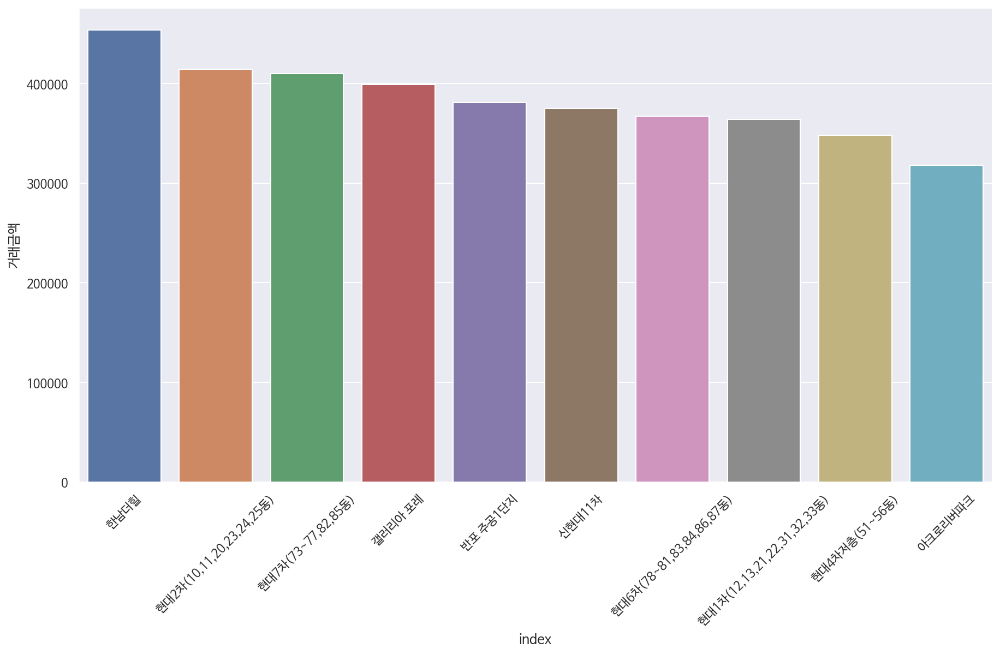

In [ ]:
plt.figure(figsize=(15,8))
plt.xticks(rotation=45)
sns.barplot(x='index',y='거래금액',data=num_rank[num_rank.거래횟수>10].reset_index()[:10]);

## 평당가격 

In [ ]:
square_rank = pd.concat([df.groupby('아파트').mean()[['평당가']].sort_values('평당가',ascending=False),
                        df.groupby('아파트').sum()[['거래횟수']]],
                        axis = 1)
square_rank_20 = square_rank[square_rank.거래횟수>10].head(20)
square_rank_20

,평당가,거래횟수
개포주공 1단지,4008.672694,315
개포주공 4단지,3527.625434,16
아크로리버파크,3376.373516,208
아크로리버뷰신반포,3365.092303,32
반포 주공1단지,3286.373492,154
디에이치아너힐즈,3228.870708,34
"현대5차(71,72동)",3181.486518,22
청담자이,3145.874780,82
신반포10,3114.341198,76
신반포자이,3101.053182,40


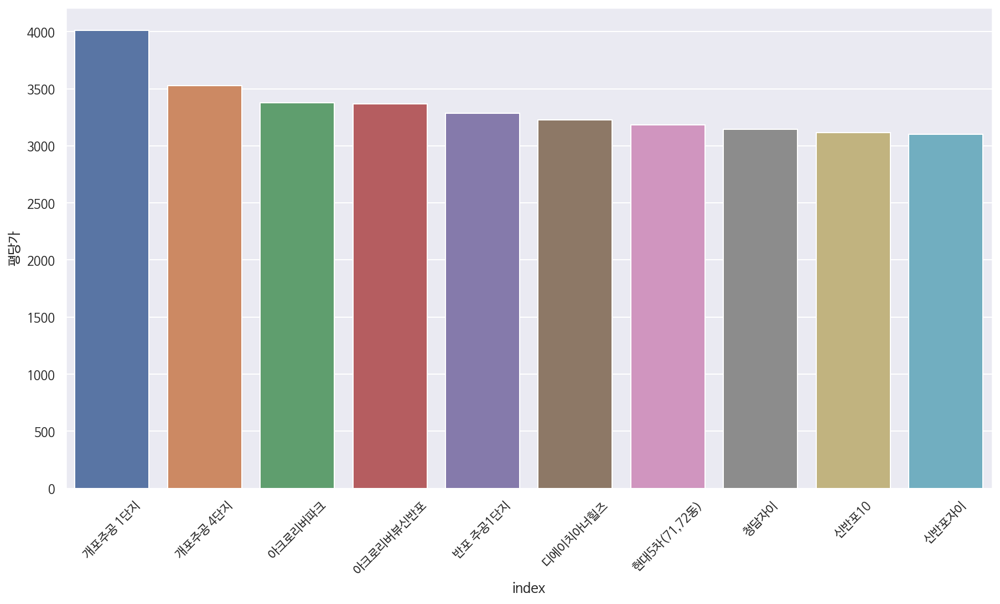

In [ ]:
plt.figure(figsize=(15,8))
plt.xticks(rotation=45)
sns.barplot(x='index',y='평당가',data=square_rank[square_rank.거래횟수>10].reset_index()[:10]);

## 구별 순위

In [ ]:
area_rank = pd.concat([df.groupby('지역코드').mean()[['평당가','거래금액']].sort_values('평당가',ascending=False),                 
                      df.groupby('지역코드').sum()[['거래횟수']]],
                      axis = 1)
area_rank

,평당가,거래금액,거래횟수
강남구,1971.685228,173517.002698,12603
서초구,1737.081512,164425.593833,10119
송파구,1431.241896,117756.431113,15511
용산구,1423.791742,146165.636419,4948
성동구,1274.102153,99212.442809,9512
마포구,1196.714434,91212.502379,9039
광진구,1123.275618,93812.719121,4639
동작구,1075.399784,85924.093671,8690
영등포구,1037.576428,79174.420651,10353
중구,1014.514526,79583.632167,3488


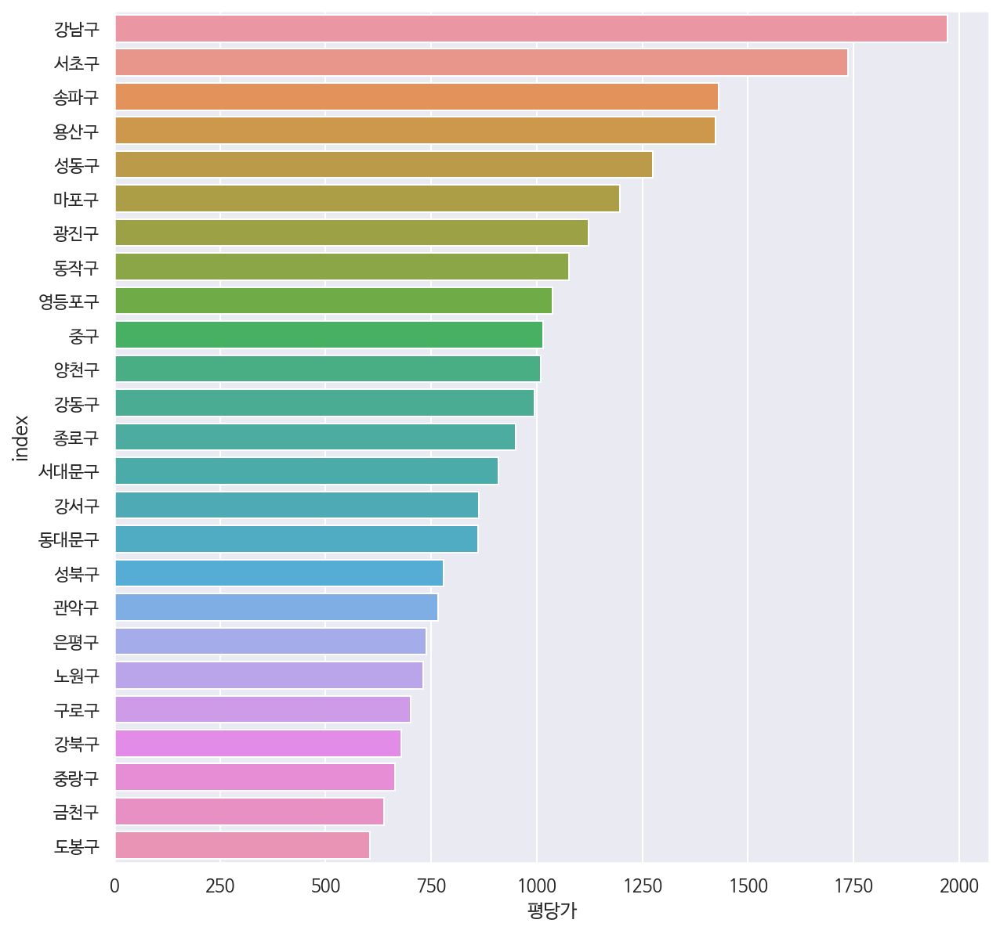

In [ ]:
plt.figure(figsize=(10,10))
sns.barplot(data=area_rank.reset_index(),y='index',x='평당가',orient='h');

## 월별 평당가 

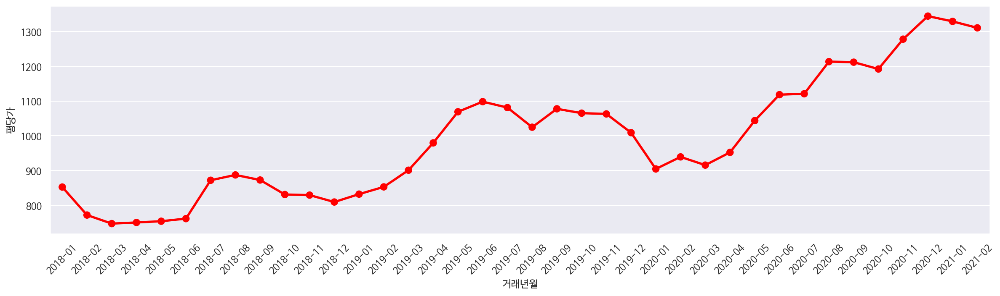

In [ ]:
month_price = df.groupby(['거래년월']).mean()[['평당가','거래금액']].sort_values('거래년월',ascending=True).reset_index()
plt.figure(figsize=(20,5))
plt.xticks(rotation=45)
sns.pointplot(x='거래년월',y='평당가',data=month_price, color='red');

## 시계열 데이터

In [ ]:
df.groupby('거래년월').mean().iloc[:,3:].head()

,거래금액,거래년도,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률),평당가,거래횟수
거래년월,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01,70612.792594,2018.0,179600.0,411552.0,2.27,114062.0,119120.0,657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.980000,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,449838.1,3.0,852.312235,1.0
2018-02,61523.327817,2018.0,179600.0,411552.0,2.27,113987.0,135440.0,621.1,2.28,2.54,2.77,2.82,1.65,1.49,1.3,2.8,0.6,1.0,0.4,2.3,1.1,2153.476667,724.950476,25512.185714,7493.314286,19.882857,3214.219524,2638.078095,11643.934286,5147.778095,3.204143,43.770952,2.849405,63.177619,449838.1,3.0,771.679820,1.0
2018-03,58725.703021,2018.0,179600.0,411552.0,2.27,113942.0,144160.0,625.2,2.27,2.50,2.71,2.83,1.65,1.49,1.2,1.2,0.8,0.9,0.4,2.6,1.3,2083.333182,687.782727,25222.585000,7224.109091,19.453182,3208.547727,2630.995909,11359.625000,5035.077727,4.109636,49.672727,2.814659,62.024091,449838.1,3.0,747.100187,1.0
2018-04,59880.198845,2018.0,179690.0,410296.0,2.26,114129.0,117443.0,643.8,2.19,2.44,2.66,2.79,1.65,1.47,1.5,3.5,1.3,0.8,0.3,2.6,1.4,2070.128947,676.494737,23894.998421,6841.821053,24.706842,3132.823684,2577.328421,10813.415789,4792.716842,3.977105,48.669474,2.766184,62.356316,473018.3,3.1,750.340782,1.0
2018-05,58970.469115,2018.0,179690.0,410296.0,2.26,114116.0,117278.0,623.9,2.25,2.53,2.76,2.86,1.65,1.50,1.5,1.7,1.5,0.6,0.2,2.8,1.3,2439.104444,863.640000,24951.283333,7151.200000,22.638889,4047.877778,3280.151667,12466.063889,5258.445000,2.668556,34.428333,3.292833,70.189444,473018.3,3.1,753.954233,1.0


In [ ]:
df_time = df.groupby('거래년월').mean().iloc[:,3:].copy()
df_norm = df_time / df_time.iloc[0] - 1

In [ ]:
df_norm.head()

,거래금액,거래년도,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률),평당가,거래횟수
거래년월,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01,0.000000,0.0,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000,0.000000,0.000000e+00,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.0
2018-02,-0.128723,0.0,0.000000,0.000000,-1.076916e-14,-0.000658,0.137005,-0.055648,4.109589e-02,4.098361e-02,0.053232,0.036765,-0.006024,-1.479927e-13,0.625,-2.555556,-2.500000e-01,-0.090909,-0.2,0.352941,0.222222,-0.145764,-0.169066,-0.011308,0.029489,0.804029,-0.243166,-0.236892,-0.122581,-0.061130,0.013211,0.249317,-0.141857,-0.163412,-2.382539e-13,0.000000,-0.094604,0.0
2018-03,-0.168342,0.0,0.000000,0.000000,-9.547918e-15,-0.001052,0.210208,-0.049415,3.652968e-02,2.459016e-02,0.030418,0.040441,-0.006024,-1.485478e-13,0.500,-1.666667,1.936229e-13,-0.181818,-0.2,0.529412,0.444444,-0.173588,-0.211668,-0.022531,-0.007496,0.765043,-0.244501,-0.238940,-0.144005,-0.081684,0.299546,0.417766,-0.152321,-0.178687,-2.399192e-13,0.000000,-0.123443,0.0
2018-04,-0.151992,0.0,0.000501,-0.003052,-4.405286e-03,0.000587,-0.014078,-0.021134,1.696421e-13,2.131628e-13,0.011407,0.025735,-0.006024,-1.342282e-02,0.875,-2.944444,6.250000e-01,-0.272727,-0.4,0.529412,0.555556,-0.178826,-0.224606,-0.073980,-0.060018,1.241723,-0.262331,-0.254465,-0.185164,-0.125887,0.257637,0.389131,-0.166920,-0.174287,5.153009e-02,0.033333,-0.119641,0.0
2018-05,-0.164876,0.0,0.000501,-0.003052,-4.405286e-03,0.000473,-0.015463,-0.051391,2.739726e-02,3.688525e-02,0.049430,0.051471,-0.006024,6.711409e-03,0.875,-1.944444,8.750000e-01,-0.454545,-0.6,0.647059,0.444444,-0.032461,-0.010101,-0.033045,-0.017513,1.054091,-0.046869,-0.051161,-0.060630,-0.040946,-0.156152,-0.017342,-0.008312,-0.070562,5.153009e-02,0.033333,-0.115401,0.0


In [ ]:
df_norm.columns

Index(['거래금액', '거래년도', '세대', '인구', '세대당인구', '자동차등록', '인구이동(전입지별)', '외국인증권투자',
       '국고채 3년(평균)', '국고채 5년(평균)', '국고채 10년(평균)', '회사채 3년(평균)', 'CD 91물(평균)',
       '콜금리(1일물,평균)', '소비자물가', '- 농축수산물', '- 공업제품', '- 집세', '- 공공서비스',
       '- 개인서비스', '근원물가', 'KS11', 'KQ11', 'DJI', 'IXIC', 'VIX', 'CSI300',
       'SSEC', 'DE30', 'FCHI', 'NG', 'GC', 'HG', 'CL', '국내총생산(명목GDP)',
       '경제성장률(실질GDP성장률)', '평당가', '거래횟수'],
      dtype='object')

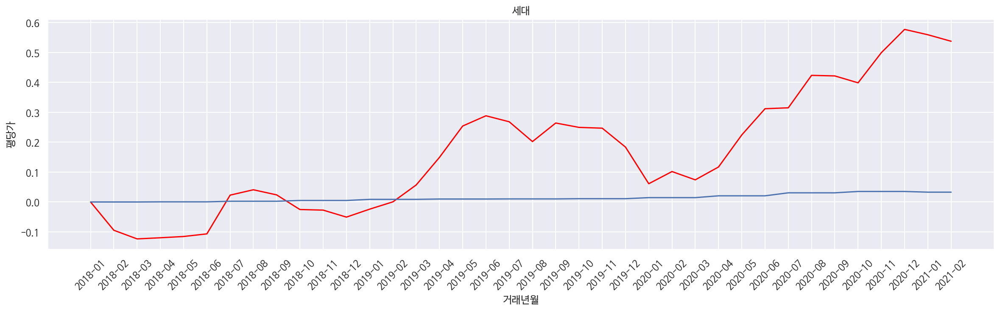

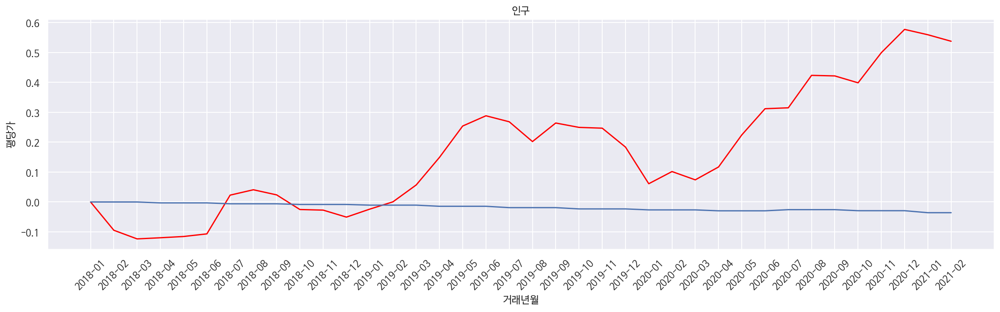

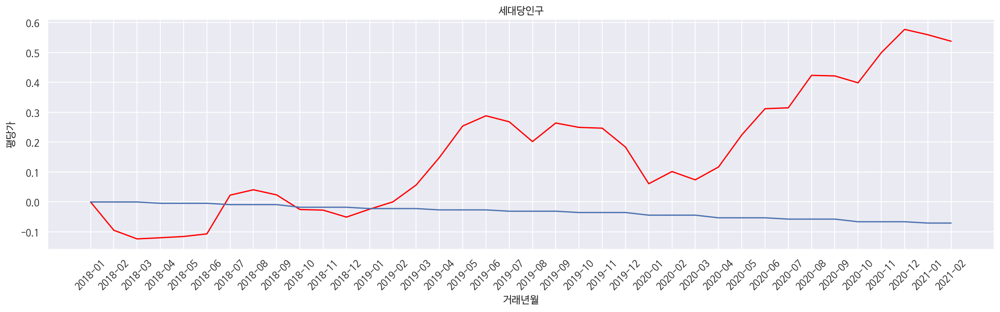

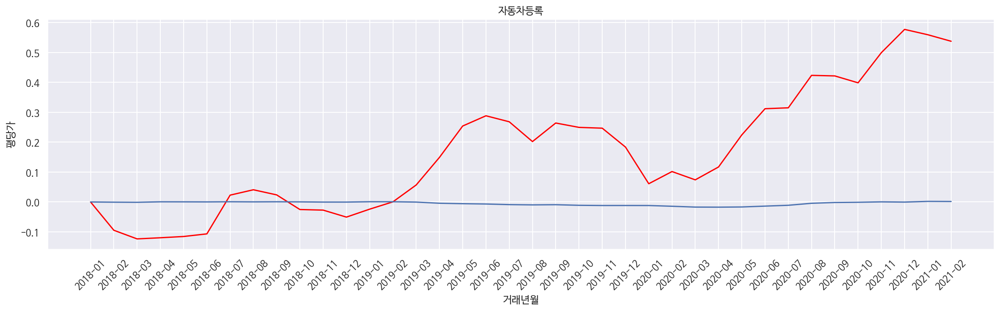

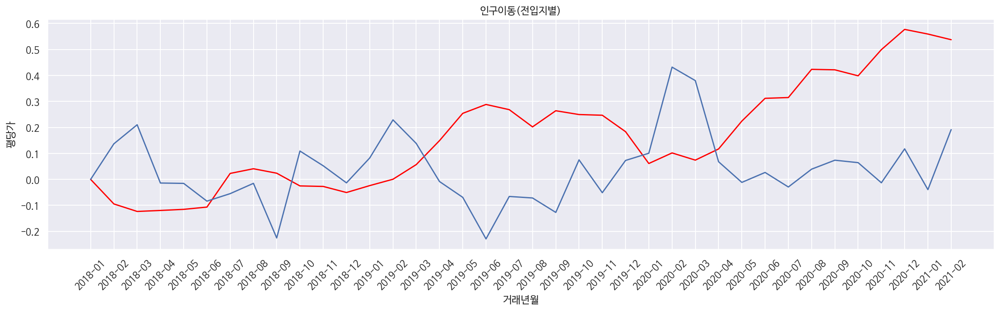

...

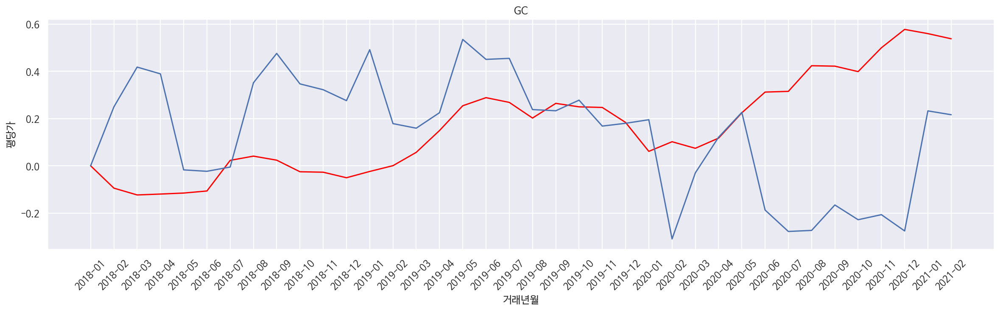

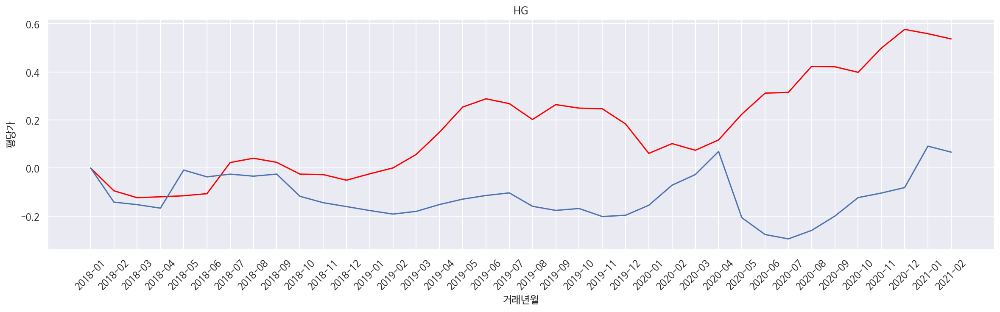

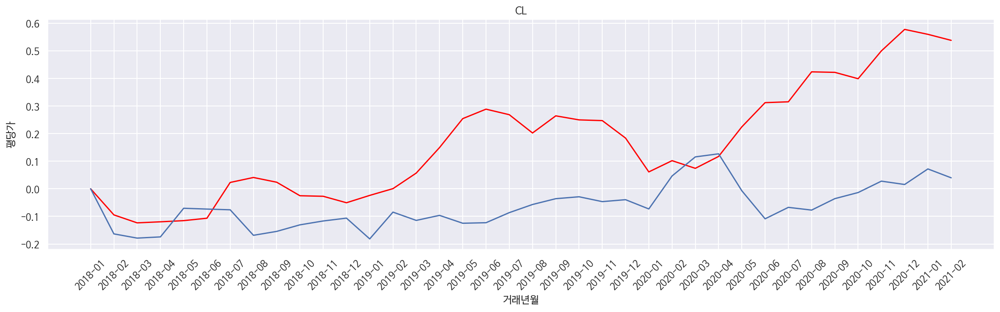

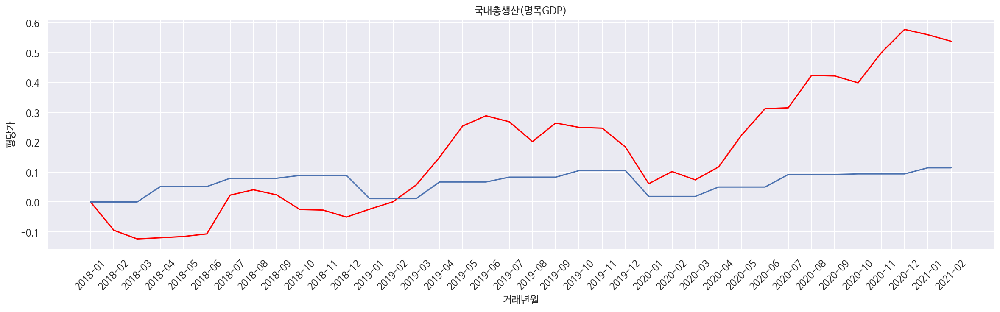

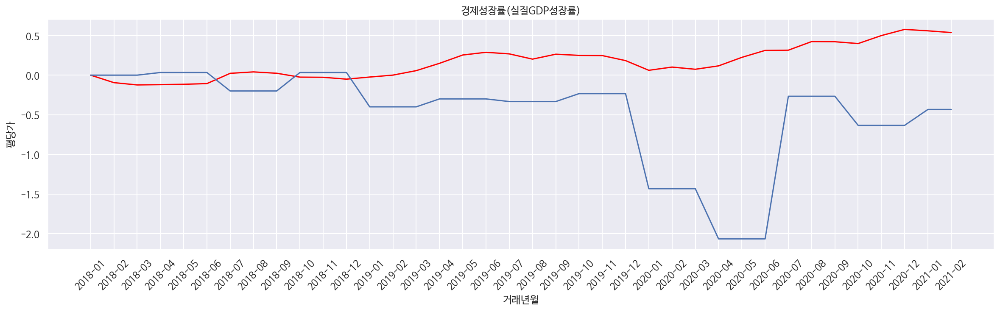

In [ ]:
for col in df_norm.columns[2:-2]:
  plt.figure(figsize=(20,5))
  plt.xticks(rotation=45)
  plt.title(col)
  sns.lineplot(x='거래년월',y='평당가',data=df_norm.reset_index(), color='red')
  sns.lineplot(x='거래년월',y=col,data=df_norm.reset_index())

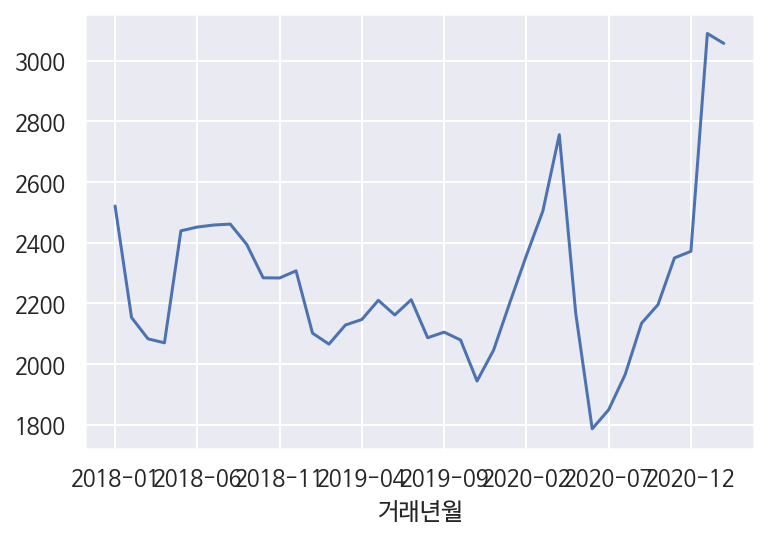

In [ ]:
df_time['KS11'].plot();

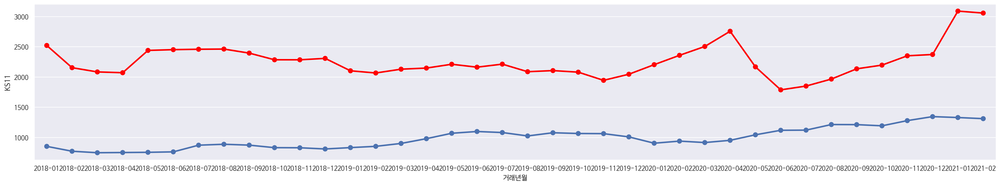

In [ ]:
df_time['mean'] = (df_time['KS11']+df_time['IXIC'])/11
plt.figure(figsize=(30,5))
sns.pointplot(x="거래년월",y="평당가",data=df_time.reset_index())
sns.pointplot(x="거래년월",y="KS11",data=df_time.reset_index(),color='red');

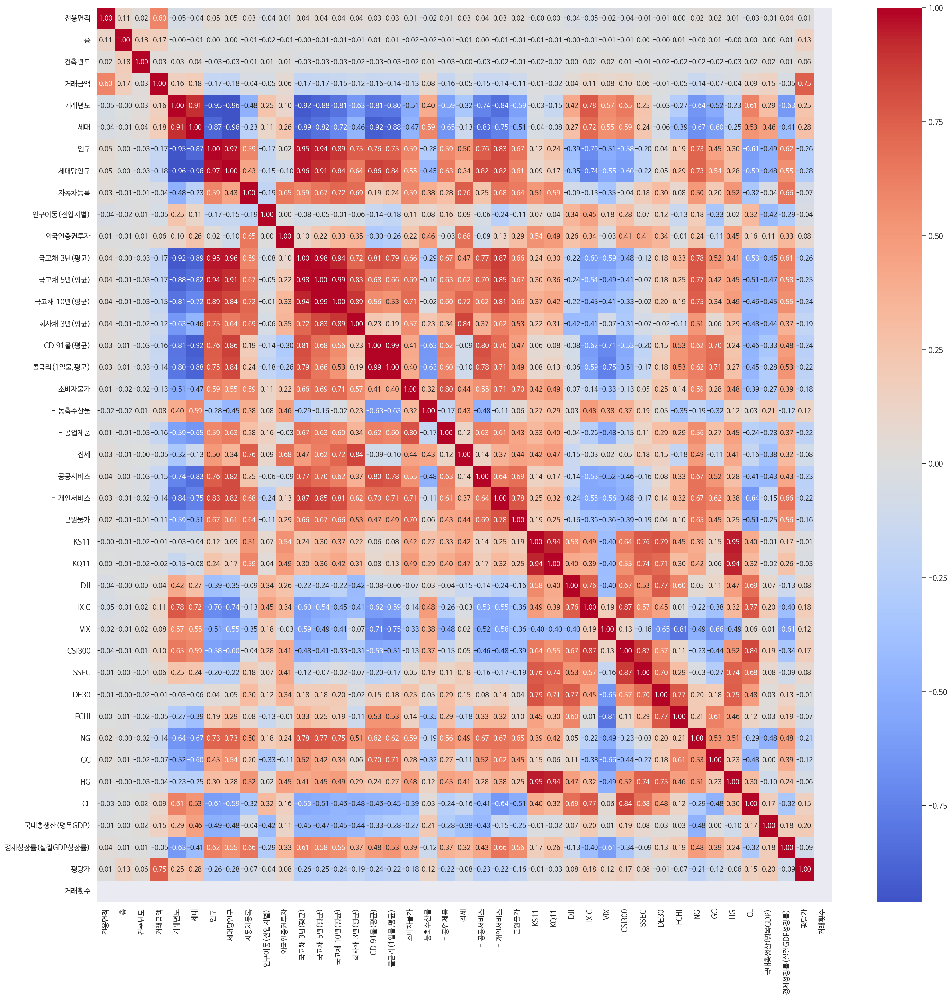

In [ ]:
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(),cmap='coolwarm',center=0,annot=True,fmt='.2f');

## 인구vs세대당인구vs인구이동(전입지별)

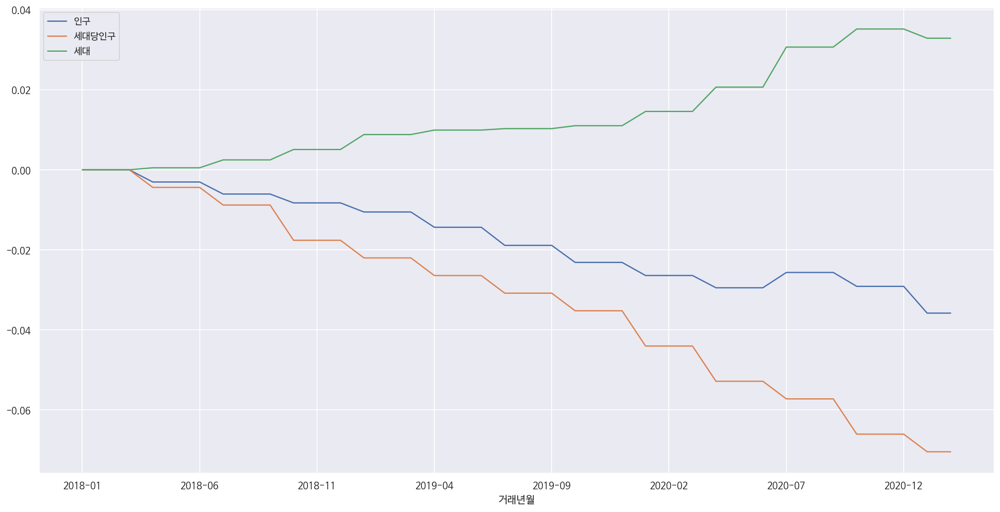

In [ ]:
df_norm[['인구','세대당인구','세대',]].plot(figsize=(20,10));

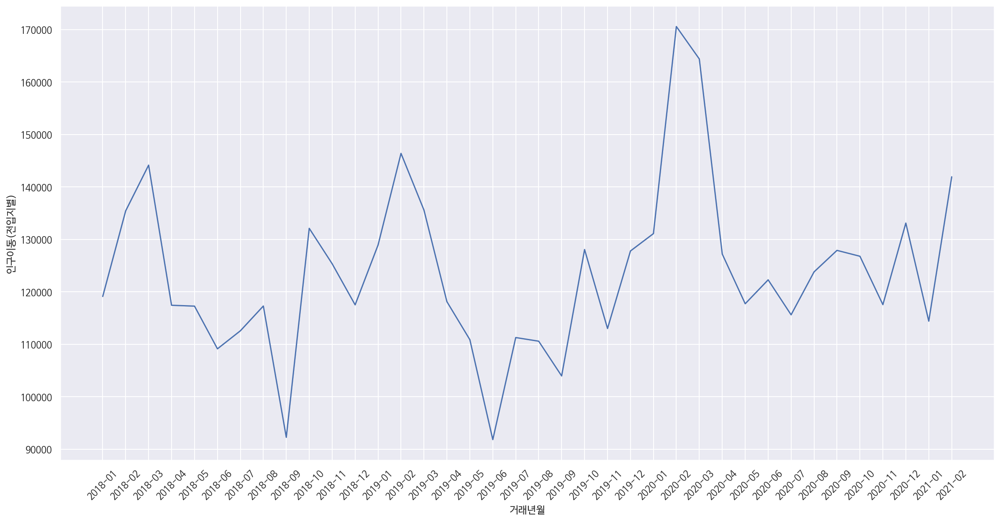

In [ ]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=45)
sns.lineplot(data=df,x='거래년월',y='인구이동(전입지별)');

## 집값분포

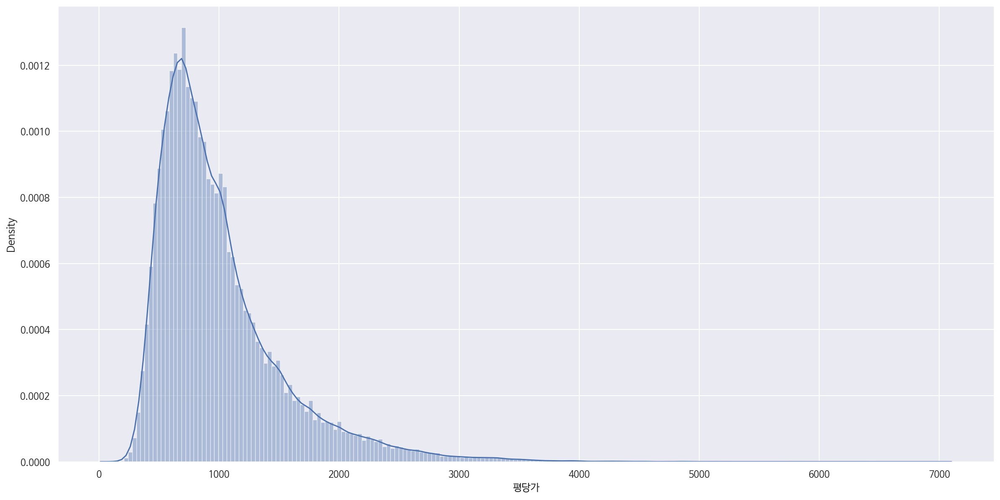

In [ ]:
plt.figure(figsize=(20,10))
sns.distplot(df.평당가,bins=200);

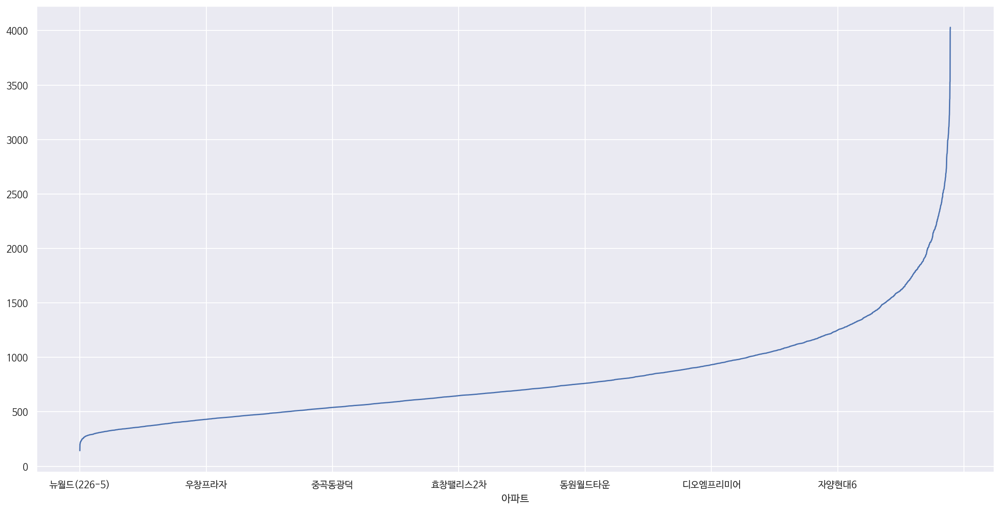

In [ ]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=45)
df.groupby('아파트').mean().sort_values('평당가').평당가.plot();

## K Clustering

In [ ]:
df.head(1)

,지역코드,법정동,아파트,지번,전용면적,층,건축년도,거래금액,거래년도,거래년월,세대,인구,세대당인구,자동차등록,인구이동(전입지별),외국인증권투자,국고채 3년(평균),국고채 5년(평균),국고채 10년(평균),회사채 3년(평균),CD 91물(평균),"콜금리(1일물,평균)",소비자물가,- 농축수산물,- 공업제품,- 집세,- 공공서비스,- 개인서비스,근원물가,KS11,KQ11,DJI,IXIC,VIX,CSI300,SSEC,DE30,FCHI,NG,GC,HG,CL,국내총생산(명목GDP),경제성장률(실질GDP성장률),평당가,거래횟수
0,종로구,내수동,경희궁의아침2단지,71,140.78,15,2004,130000,2018,2018-01,179600,411552,2.27,114062,119120,657.7,2.19,2.44,2.63,2.72,1.66,1.49,0.8,-1.8,0.8,1.1,0.5,1.7,0.9,2520.937727,872.452727,25803.98,7278.672727,11.021364,4246.925455,3457.016364,13270.667273,5482.949091,3.162364,35.035909,3.320432,75.518182,449838.1,3.0,923.426623,1


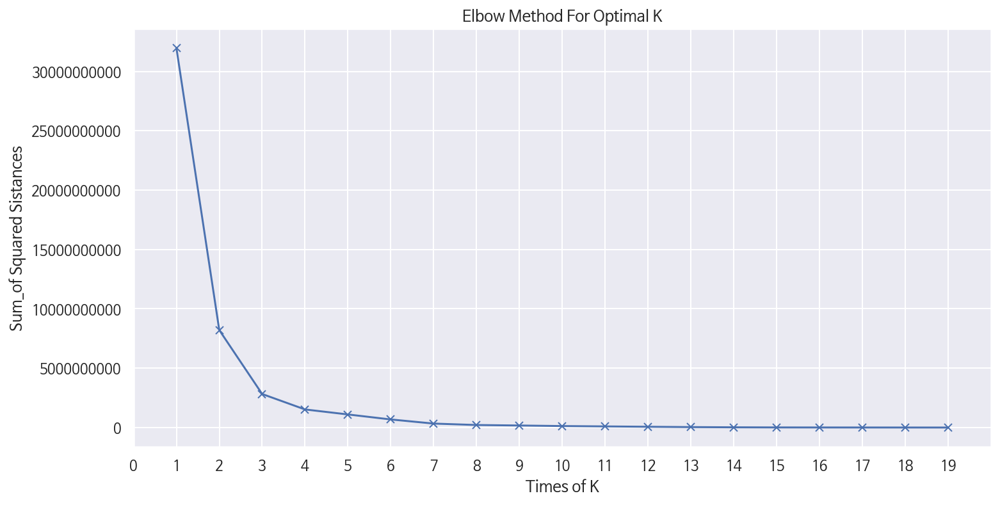

In [ ]:
from sklearn.cluster import KMeans
sum_of_squared_distances = []
for n_k in range(1, 20) :
    num = KMeans(n_clusters = n_k)
    num = num.fit(area_rank[['평당가','거래금액']])
    sum_of_squared_distances.append(num.inertia_)

plt.figure(figsize=(12,6))

plt.xlim(0, 20)
plt.xticks(ticks=np.arange(0, 20, step=1))
plt.plot(range(1, 20), sum_of_squared_distances, 'bx-')
plt.xlabel('Times of K')
plt.ylabel('Sum_of Squared Sistances')
plt.title('Elbow Method For Optimal K')
plt.show();

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5)
kmeans.fit(area_rank)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [ ]:
area_rank['K_label'] = kmeans.labels_
area_rank

,평당가,거래금액,거래횟수,K_label
강남구,1971.685228,173517.002698,12603,3
서초구,1737.081512,164425.593833,10119,3
송파구,1431.241896,117756.431113,15511,1
용산구,1423.791742,146165.636419,4948,3
성동구,1274.102153,99212.442809,9512,4
마포구,1196.714434,91212.502379,9039,4
광진구,1123.275618,93812.719121,4639,4
동작구,1075.399784,85924.093671,8690,4
영등포구,1037.576428,79174.420651,10353,2
중구,1014.514526,79583.632167,3488,2


In [ ]:
gu_mapper = {gu:k for gu,k in zip(area_rank.index,area_rank.K_label)}

In [ ]:
df['K_label'] = df['지역코드'].copy()
df['K_label'] = df['K_label'].replace(gu_mapper)

In [ ]:
!pip install ptitprince

     |████████████████████████████████| 52 kB 1.1 MB/s 
  Created wheel for ptitprince: filename=ptitprince-0.2.5-py3-none-any.whl size=8426 sha256=445ec08d36866d0b707e9106761a5801063bd8a58c158895f1e2eb3aabd40114
  Stored in directory: /root/.cache/pip/wheels/58/a5/f2/55920bbc5d0e6fb74b2370e1e52e07c236ba7b621236ea5a81
Successfully built ptitprince


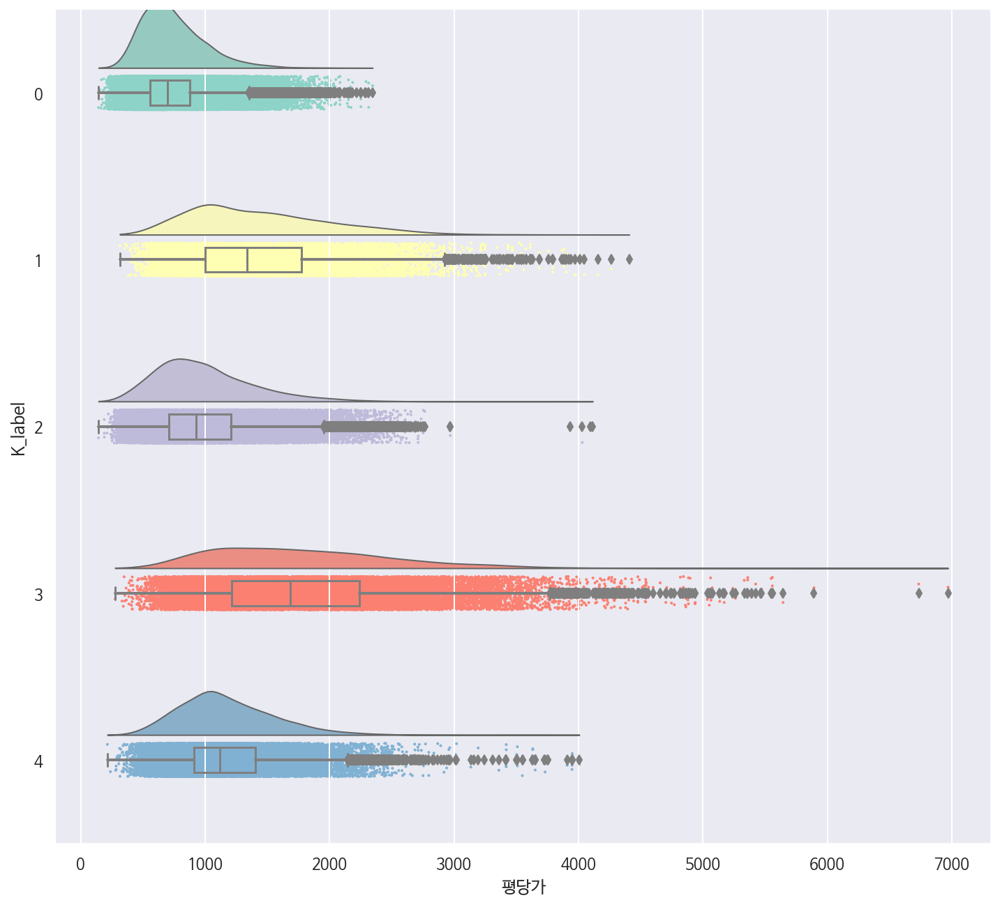

In [ ]:
from ptitprince import PtitPrince as pt

f, ax = plt.subplots(figsize=(12, 11))

dx="평당가"; dy="K_label"; ort="h"
ax=pt.half_violinplot(data=df, palette="Set3", bw=.2,  linewidth=1,cut=0.,\
                   scale="area", width=.8, inner=None,orient=ort,x=dx,y=dy)
ax=sns.stripplot(data=df, palette="Set3", edgecolor="white",size=2,orient=ort,\
                 x=dx,y=dy,jitter=1,zorder=0)
ax=sns.boxplot(data=df, color="#d4d4d4",orient=ort,width=.15,x=dx,y=dy,zorder=10,\
              showcaps=True,boxprops={'facecolor':'none', "zorder":10},\
               showfliers=True,whiskerprops={'linewidth':2, "zorder":10},saturation=1)

# Finalize the figure
#ax.set(ylim=(3.5, -.7))
sns.despine(left=True)

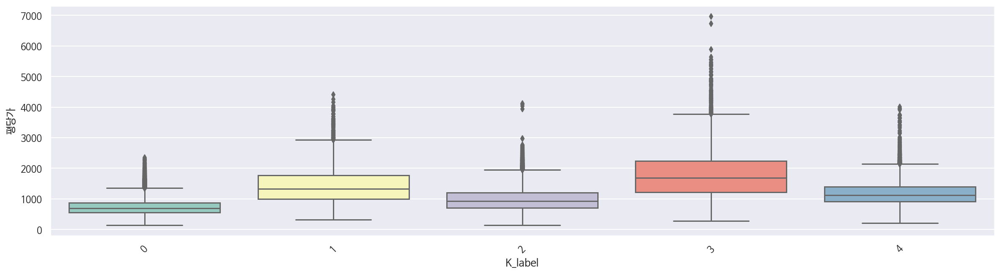

In [ ]:
plt.figure(figsize=(20,5))
plt.xticks(rotation=45)
sns.('K_label','평당가',data=df,palette="Set3");

##지역코드에 따른 평당가 Boxplot

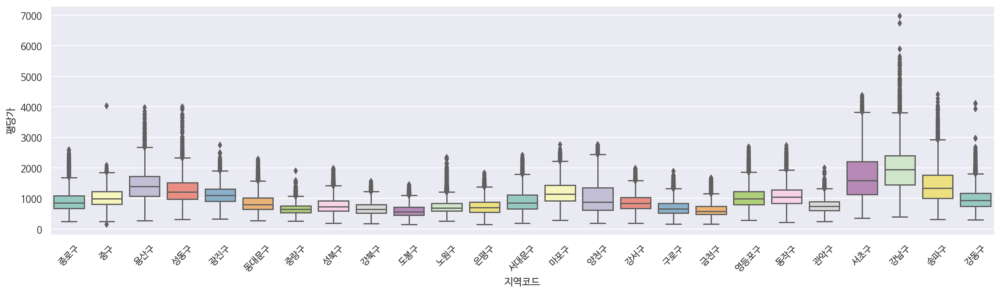

In [ ]:
plt.figure(figsize=(20,5))
plt.xticks(rotation=45)
sns.boxplot('지역코드','평당가',data=df,palette="Set3");

##거래월일에 따른 평당가 분포

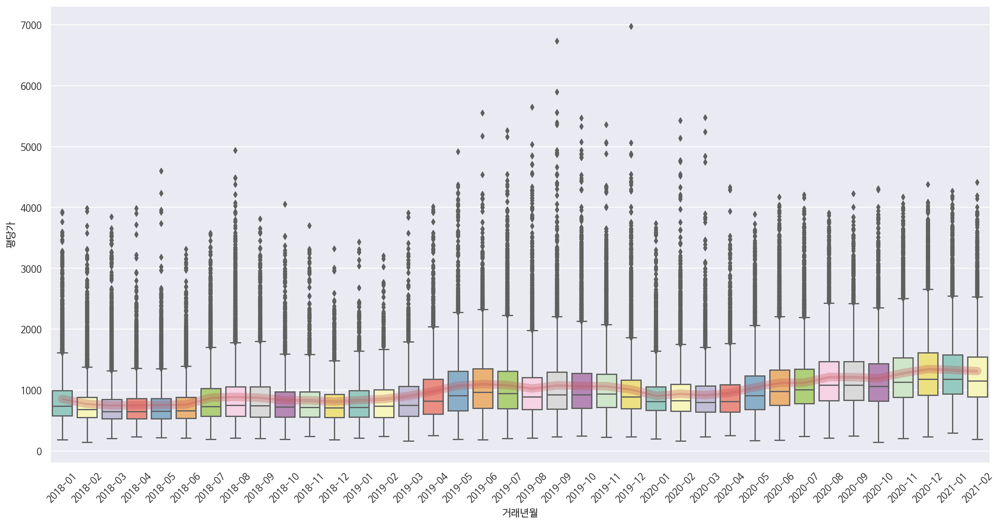

In [ ]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=45)
sns.boxplot('거래년월','평당가',data=df,palette="Set3")
sns.lineplot(data=df,x='거래년월',y='평당가',color='r',linewidth=10,alpha=0.3);

## 건축년도에 따른 평당가 산점도

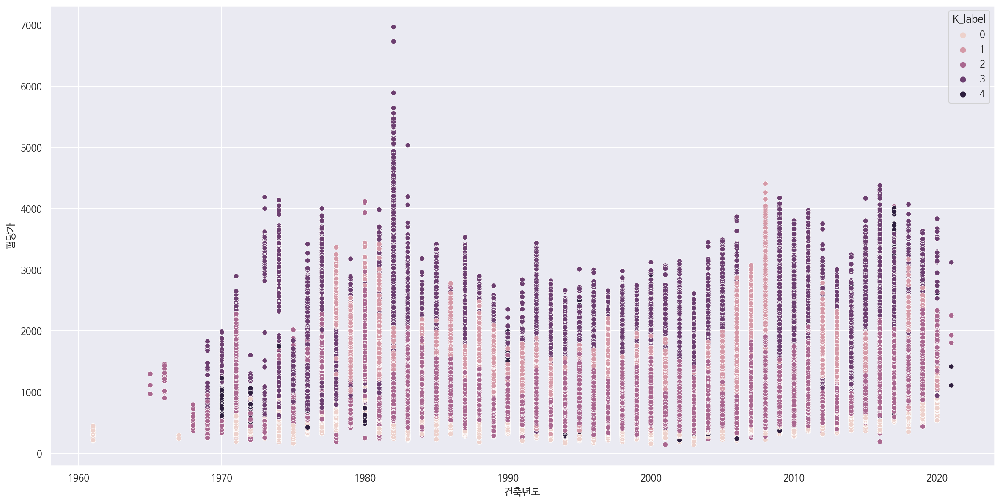

In [ ]:
plt.figure(figsize=(20,10))
sns.scatterplot('건축년도','평당가',hue='K_label',data=df);

## 전용면적에 따른 평당가 산점도

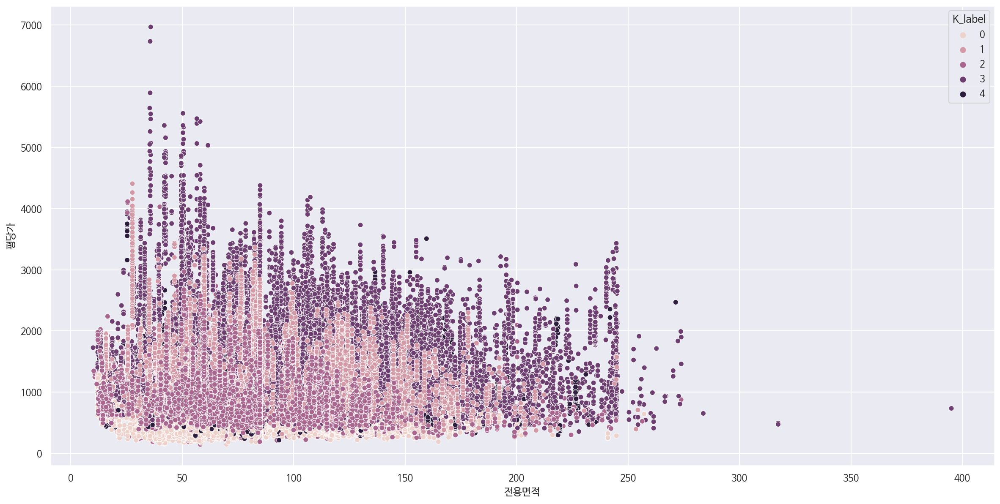

In [ ]:
plt.figure(figsize=(20,10))
sns.scatterplot('전용면적','평당가',hue='K_label',data=df);

## 건축년도에 따른 거래금액 산점도

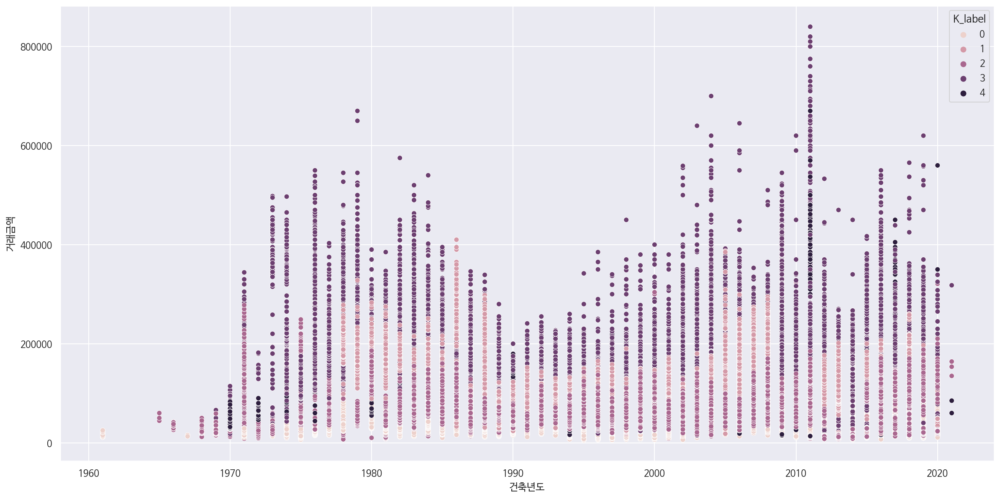

In [ ]:
plt.figure(figsize=(20,10))
sns.scatterplot('건축년도','거래금액',hue='K_label',data=df);

## 거래금액 따른 평당가 산점도

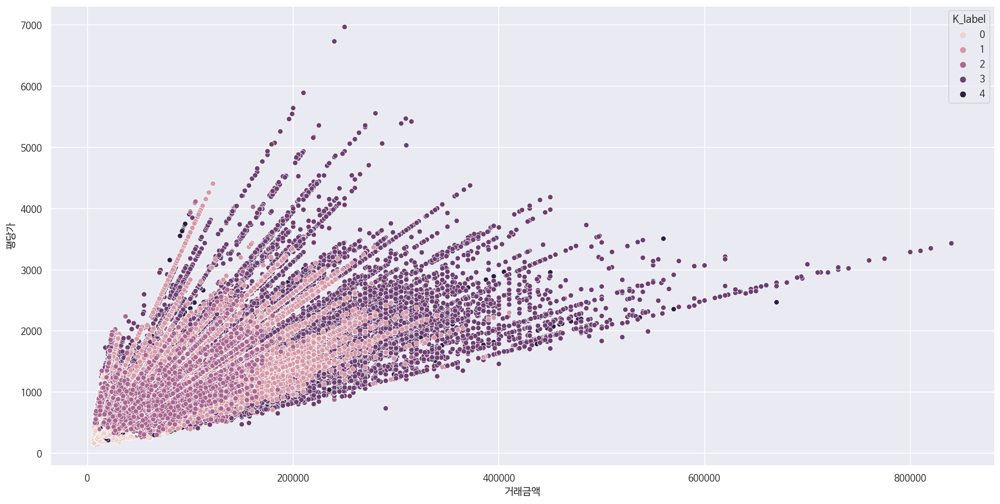

In [ ]:
plt.figure(figsize=(20,10))
sns.scatterplot('거래금액','평당가',hue='K_label',data=df);

## 인구+자동차등록

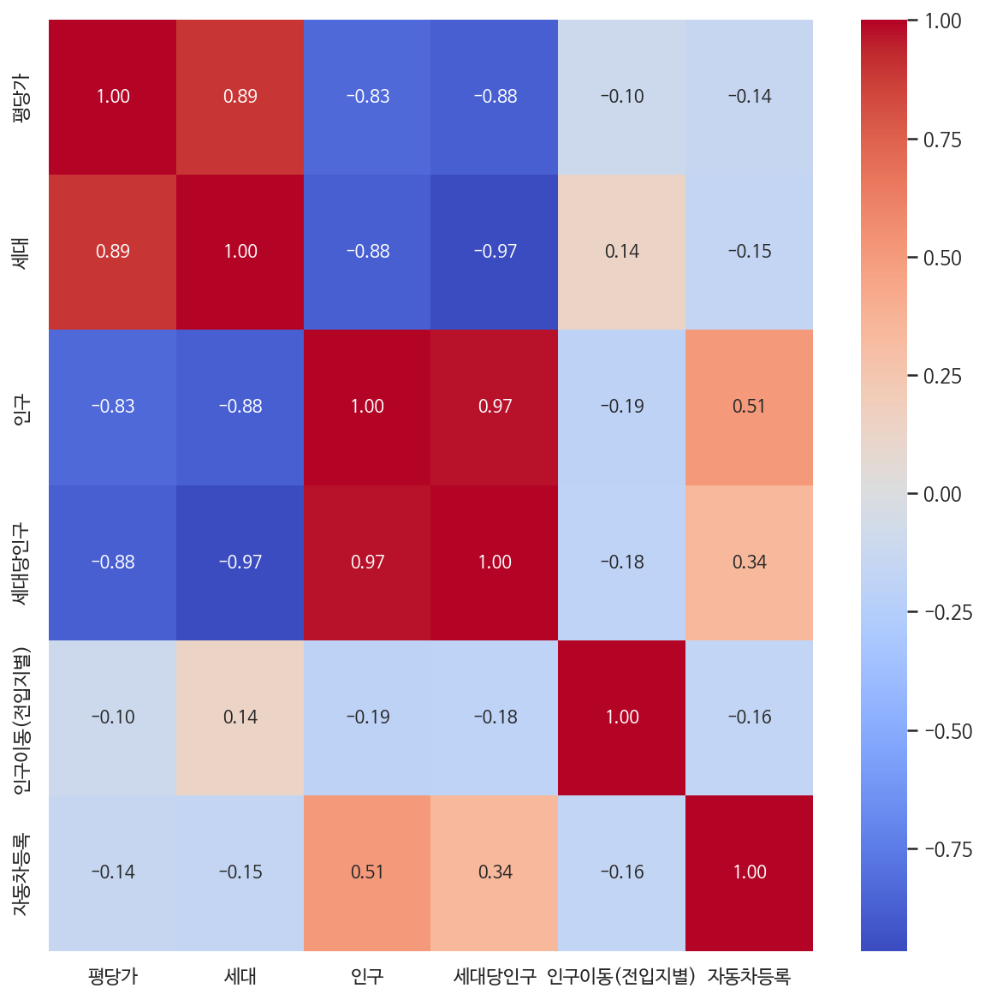

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(df_norm[['평당가','세대','인구', '세대당인구', '인구이동(전입지별)', '자동차등록']].corr(), cmap='coolwarm', annot=True,fmt='.2f');

<Figure size 720x720 with 0 Axes>

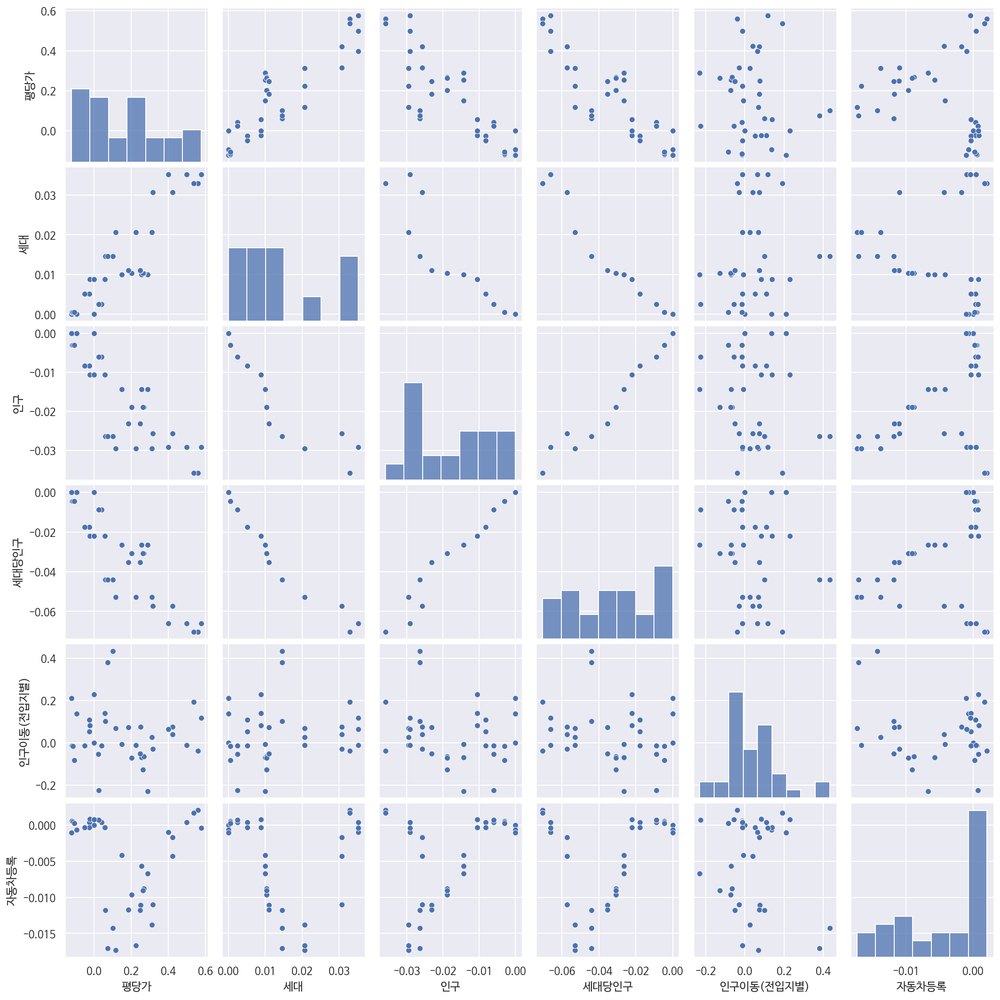

In [ ]:
plt.figure(figsize=(10,10))
sns.pairplot(df_norm[['평당가','세대','인구', '세대당인구', '인구이동(전입지별)', '자동차등록']]);

In [ ]:
from scipy import stats

def chi_test(price, compare) :
  fvalue, pvalue,_,_ = stats.chi2_contingency(pd.crosstab(df_norm[price], df_norm[compare]), correction = True)
  print('pvalue : %.3f'%pvalue)
  if pvalue < 0.05 :
    print(f'pvalue가 0.05보다 작으므로 월별 평당가 평균과 {compare}간에는 연관이 있다.')
  else : 
    print(f'pvalue가 0.05보다 크므로 월별 평당가 평균과 {compare}간에는 연관이 없다.')

chi_test('평당가', '세대')
chi_test('평당가', '인구')
chi_test('평당가', '세대당인구')
chi_test('평당가', '인구이동(전입지별)')
chi_test('평당가', '자동차등록')

pvalue : 0.337
pvalue가 0.05보다 크므로 월별 평당가 평균과 세대간에는 연관이 없다.
pvalue : 0.337
pvalue가 0.05보다 크므로 월별 평당가 평균과 인구간에는 연관이 없다.
pvalue : 0.244
pvalue가 0.05보다 크므로 월별 평당가 평균과 세대당인구간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 인구이동(전입지별)간에는 연관이 없다.
pvalue : 0.241
pvalue가 0.05보다 크므로 월별 평당가 평균과 자동차등록간에는 연관이 없다.


## 주가지수

In [ ]:
def engine(xxx):
  xxx['KRX'] = xxx.KS11 + xxx.KQ11
  return xxx

df_norm2 = engine(df_norm.copy())

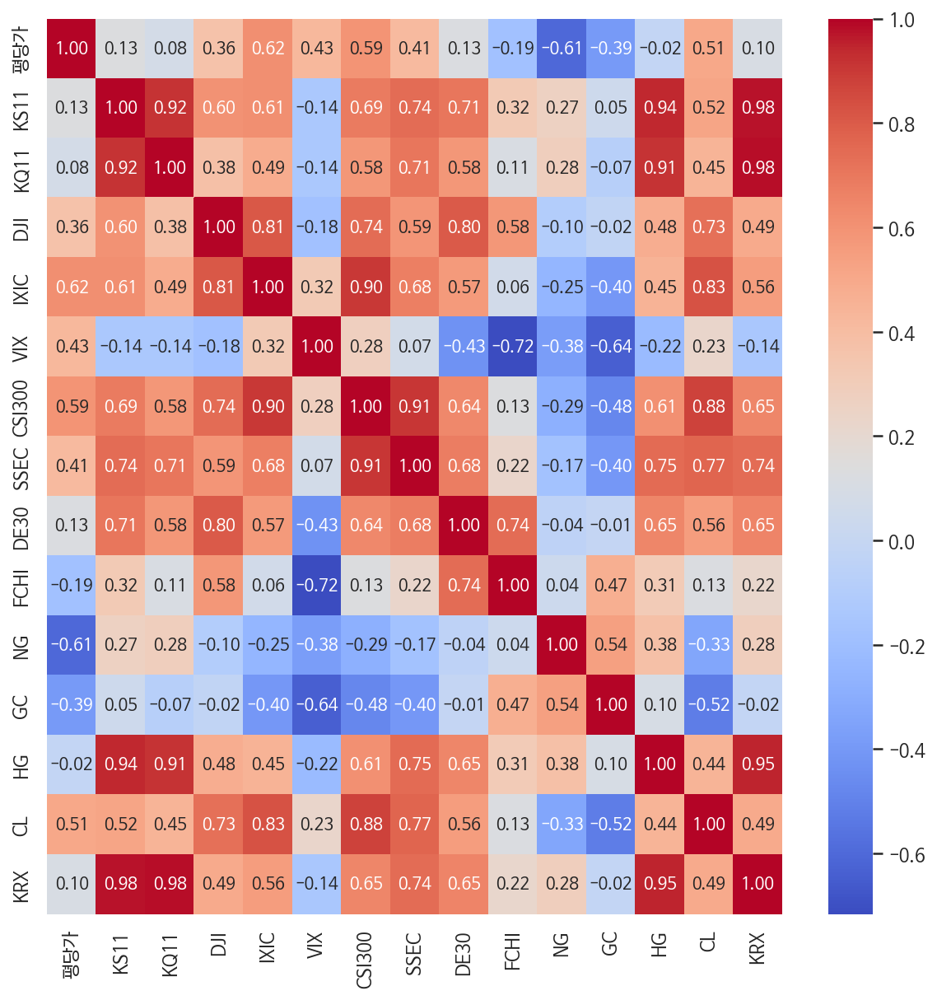

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(df_norm2[['평당가', 'KS11',	'KQ11',	'DJI','IXIC',	'VIX',	'CSI300',	'SSEC',	'DE30',	'FCHI',	'NG',	'GC',	'HG',	'CL', 'KRX']].corr(), cmap='coolwarm', annot=True,fmt='.2f');

<Figure size 360x720 with 0 Axes>

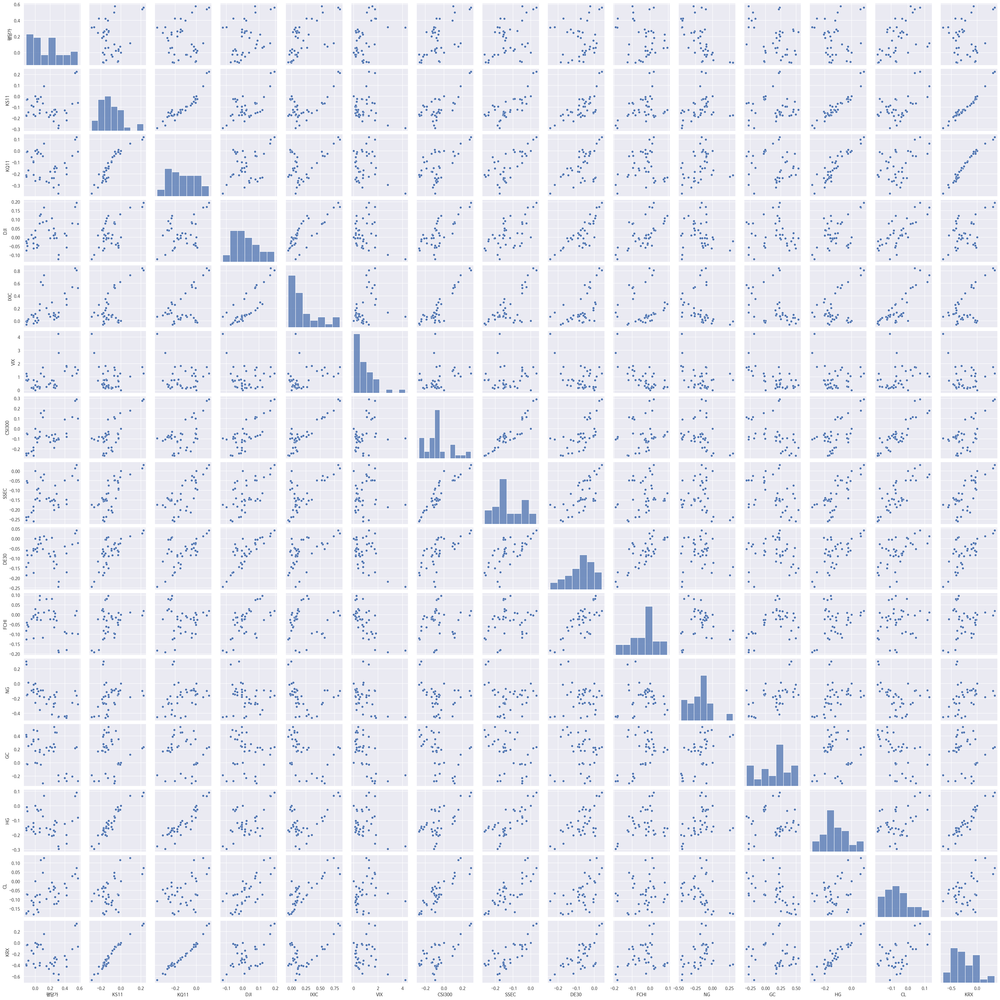

In [ ]:
plt.figure(figsize=(5,10))
sns.pairplot(df_norm2[['평당가', 'KS11',	'KQ11',	'DJI','IXIC',	'VIX',	'CSI300',	'SSEC',	'DE30',	'FCHI',	'NG',	'GC',	'HG',	'CL', 'KRX']]);

In [ ]:
from scipy import stats

chi_test('평당가', 'KS11')
chi_test('평당가', 'KQ11')
chi_test('평당가', 'DJI')
chi_test('평당가', 'IXIC')
chi_test('평당가', 'VIX')
chi_test('평당가', 'CSI300')
chi_test('평당가', 'SSEC')
chi_test('평당가', 'DE30')
chi_test('평당가', 'FCHI')
chi_test('평당가', 'NG')
chi_test('평당가', 'GC')
chi_test('평당가', 'HG')
chi_test('평당가', 'CL')

pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 KS11간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 KQ11간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 DJI간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 IXIC간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 VIX간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 CSI300간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 SSEC간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 DE30간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 FCHI간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 NG간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 GC간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 HG간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 CL간에는 연관이 없다.


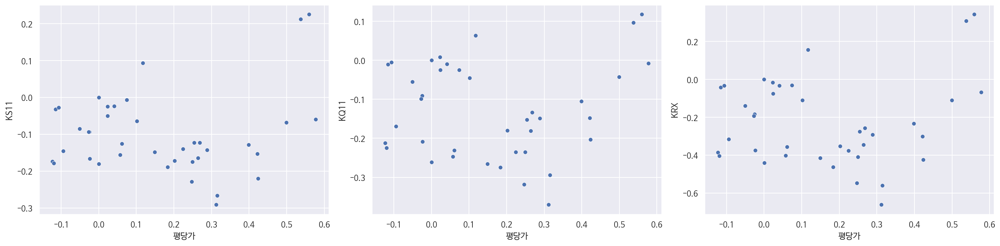

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(20,5))
sns.scatterplot("평당가", "KS11", data=df_norm2, ax=ax[0])
sns.scatterplot("평당가", "KQ11", data=df_norm2, ax=ax[1])
sns.scatterplot("평당가", "KRX", data=df_norm2, ax=ax[2])
plt.tight_layout()

## 금리

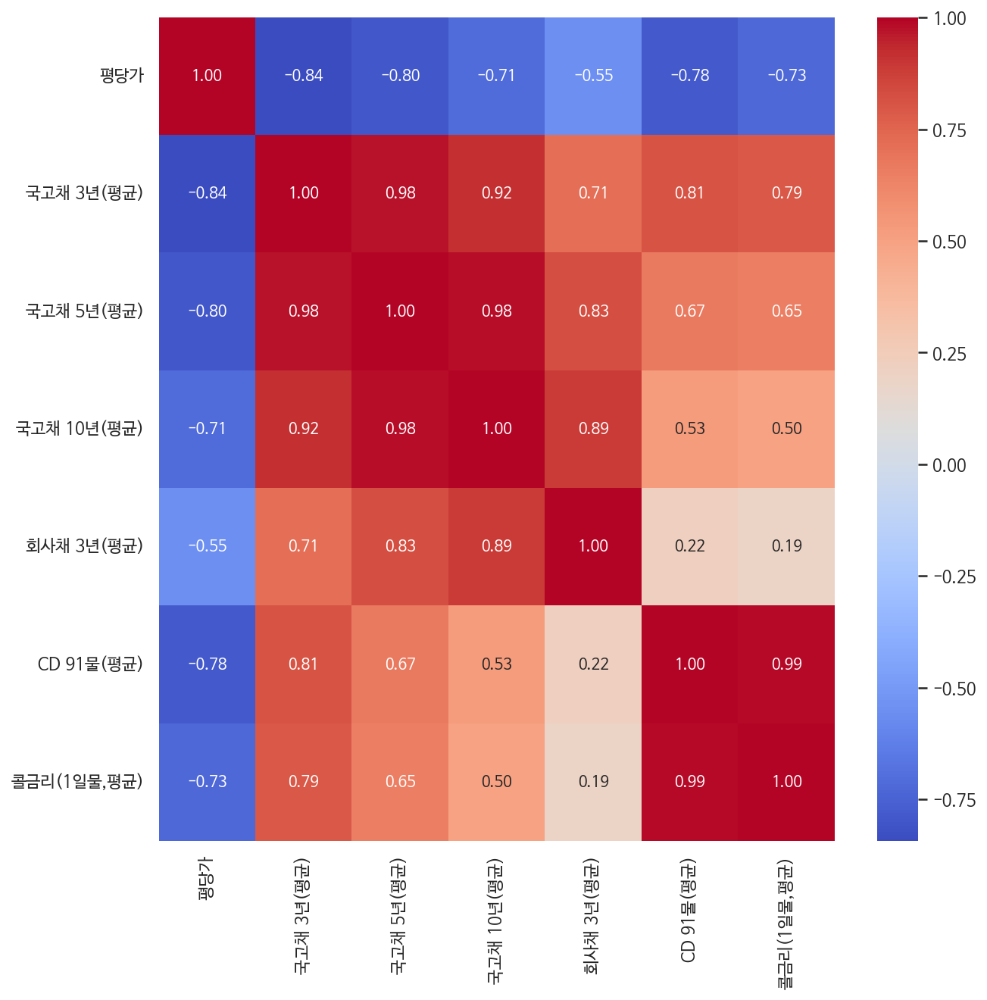

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.concat([df_norm.평당가, df_norm.iloc[:, 8:14]], axis=1).corr(), cmap='coolwarm', annot=True,fmt='.2f');

<Figure size 720x720 with 0 Axes>

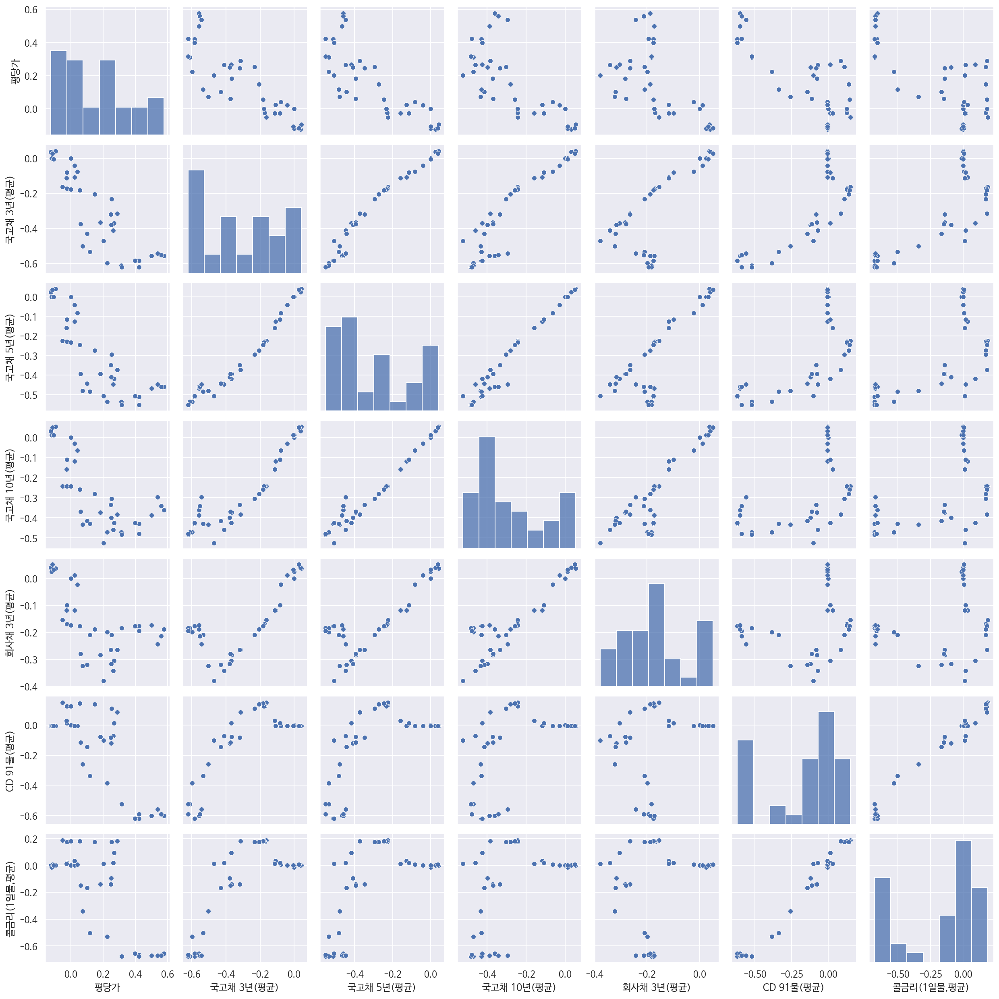

In [ ]:
plt.figure(figsize=(10,10))
sns.pairplot(pd.concat([df_norm.평당가, df_norm.iloc[:, 8:14]], axis=1));

In [ ]:
chi_test('평당가', df_norm.iloc[:,8].name)
chi_test('평당가', df_norm.iloc[:,9].name)
chi_test('평당가', df_norm.iloc[:,10].name)
chi_test('평당가', df_norm.iloc[:,11].name)
chi_test('평당가', df_norm.iloc[:,12].name)
chi_test('평당가', df_norm.iloc[:,13].name)

pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 국고채 3년(평균)간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 국고채 5년(평균)간에는 연관이 없다.
pvalue : 0.241
pvalue가 0.05보다 크므로 월별 평당가 평균과 국고채 10년(평균)간에는 연관이 없다.
pvalue : 0.244
pvalue가 0.05보다 크므로 월별 평당가 평균과 회사채 3년(평균)간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 CD 91물(평균)간에는 연관이 없다.
pvalue : 0.247
pvalue가 0.05보다 크므로 월별 평당가 평균과 콜금리(1일물,평균)간에는 연관이 없다.


## 물가

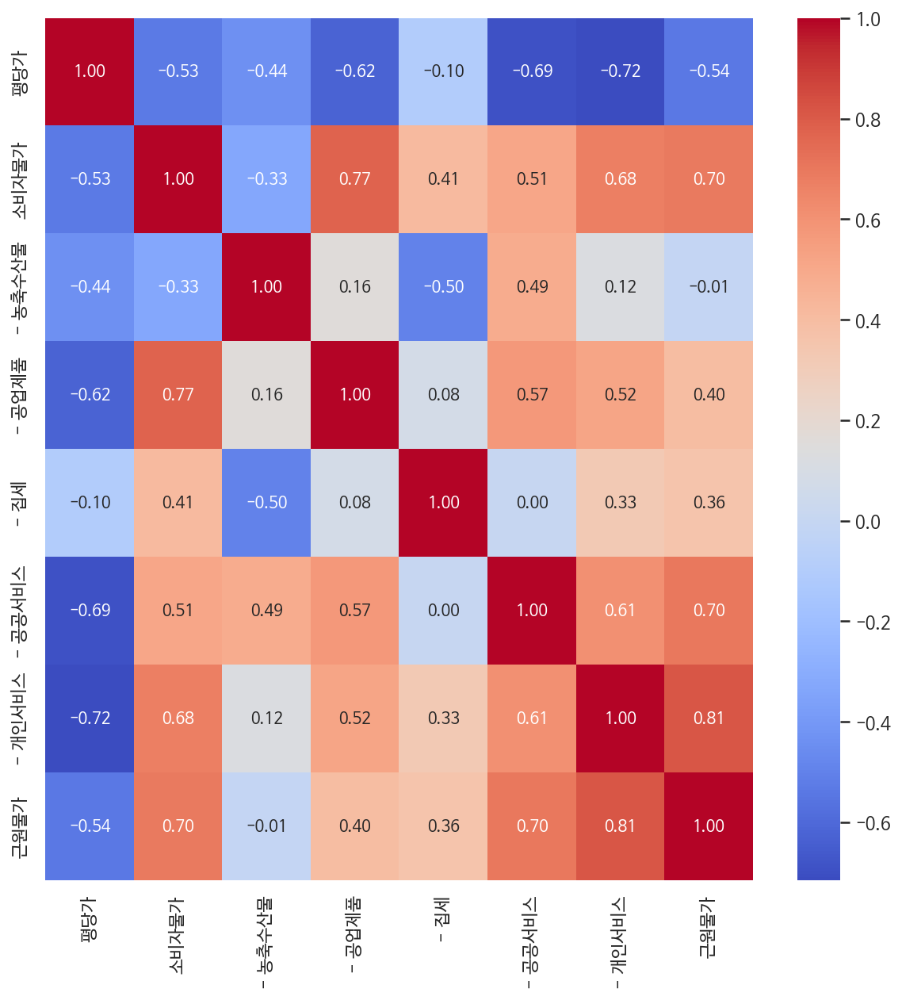

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.concat([df_norm.평당가, df_norm.iloc[:, 14:21]], axis=1).corr(), cmap='coolwarm', annot=True,fmt='.2f');

<Figure size 720x720 with 0 Axes>

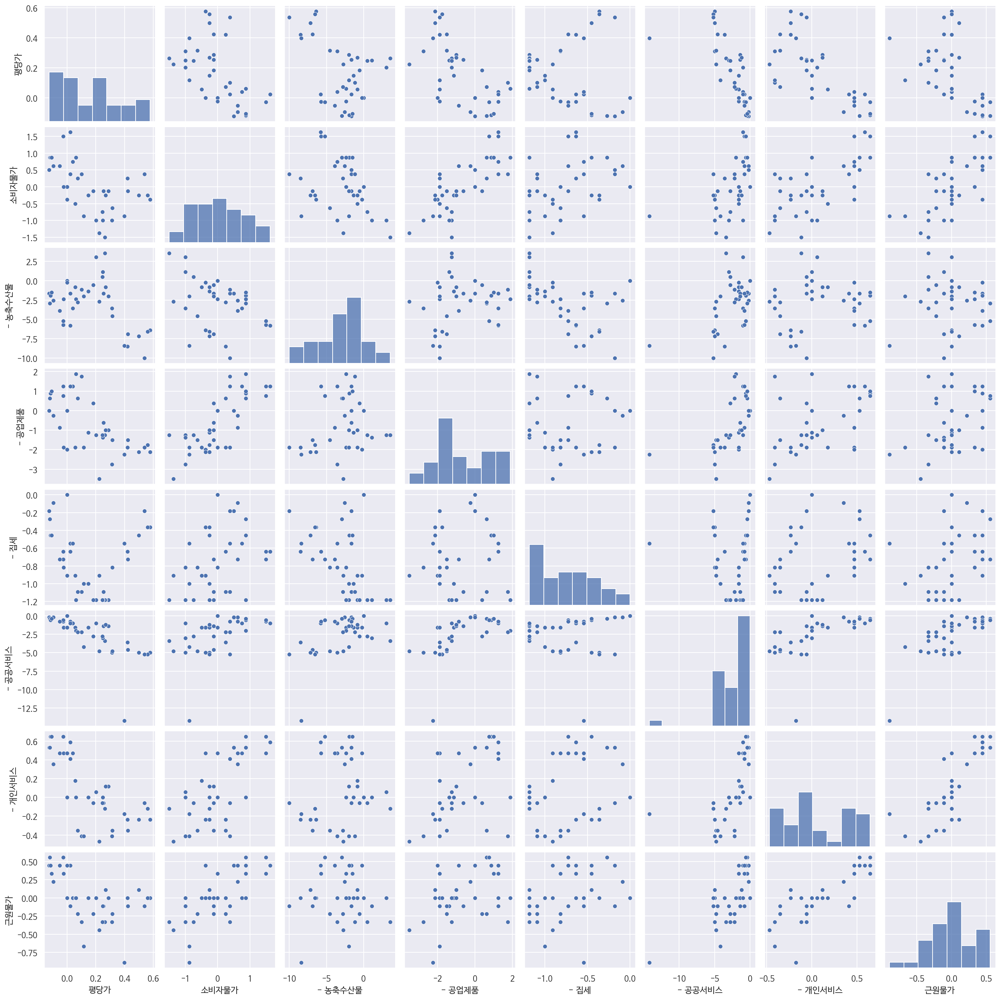

In [ ]:
plt.figure(figsize=(10,10))
sns.pairplot(pd.concat([df_norm.평당가, df_norm.iloc[:, 14:21]], axis=1));

In [ ]:
chi_test('평당가', df_norm.iloc[:,14].name)
chi_test('평당가', df_norm.iloc[:,15].name)
chi_test('평당가', df_norm.iloc[:,16].name)
chi_test('평당가', df_norm.iloc[:,17].name)
chi_test('평당가', df_norm.iloc[:,18].name)
chi_test('평당가', df_norm.iloc[:,19].name)
chi_test('평당가', df_norm.iloc[:,20].name)
chi_test('평당가', df_norm.iloc[:,21].name)

pvalue : 0.263
pvalue가 0.05보다 크므로 월별 평당가 평균과 소비자물가간에는 연관이 없다.
pvalue : 0.241
pvalue가 0.05보다 크므로 월별 평당가 평균과 - 농축수산물간에는 연관이 없다.
pvalue : 0.241
pvalue가 0.05보다 크므로 월별 평당가 평균과 - 공업제품간에는 연관이 없다.
pvalue : 0.247
pvalue가 0.05보다 크므로 월별 평당가 평균과 - 집세간에는 연관이 없다.
pvalue : 0.253
pvalue가 0.05보다 크므로 월별 평당가 평균과 - 공공서비스간에는 연관이 없다.
pvalue : 0.259
pvalue가 0.05보다 크므로 월별 평당가 평균과 - 개인서비스간에는 연관이 없다.
pvalue : 0.241
pvalue가 0.05보다 크므로 월별 평당가 평균과 근원물가간에는 연관이 없다.
pvalue : 0.238
pvalue가 0.05보다 크므로 월별 평당가 평균과 KS11간에는 연관이 없다.


## GDP

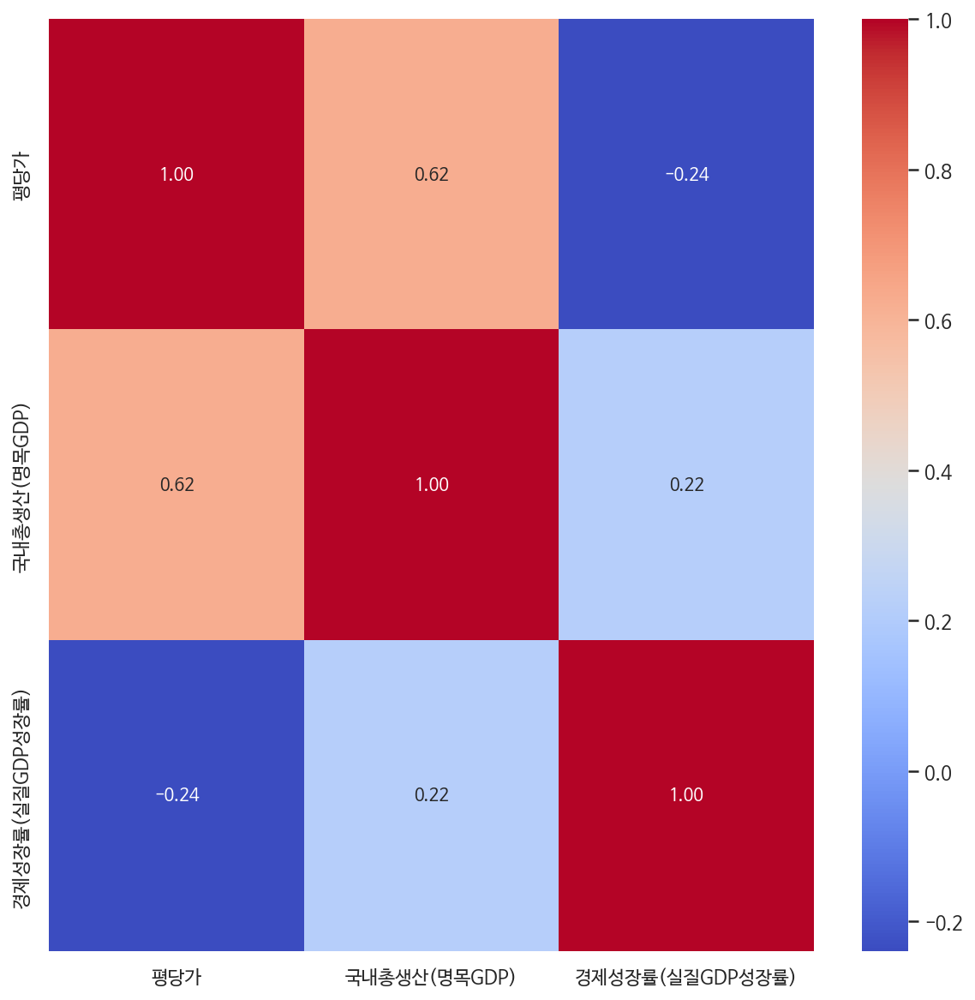

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.concat([df_norm.평당가, df_norm.iloc[:, -4:-2]], axis=1).corr(), cmap='coolwarm', annot=True,fmt='.2f');

<Figure size 720x720 with 0 Axes>

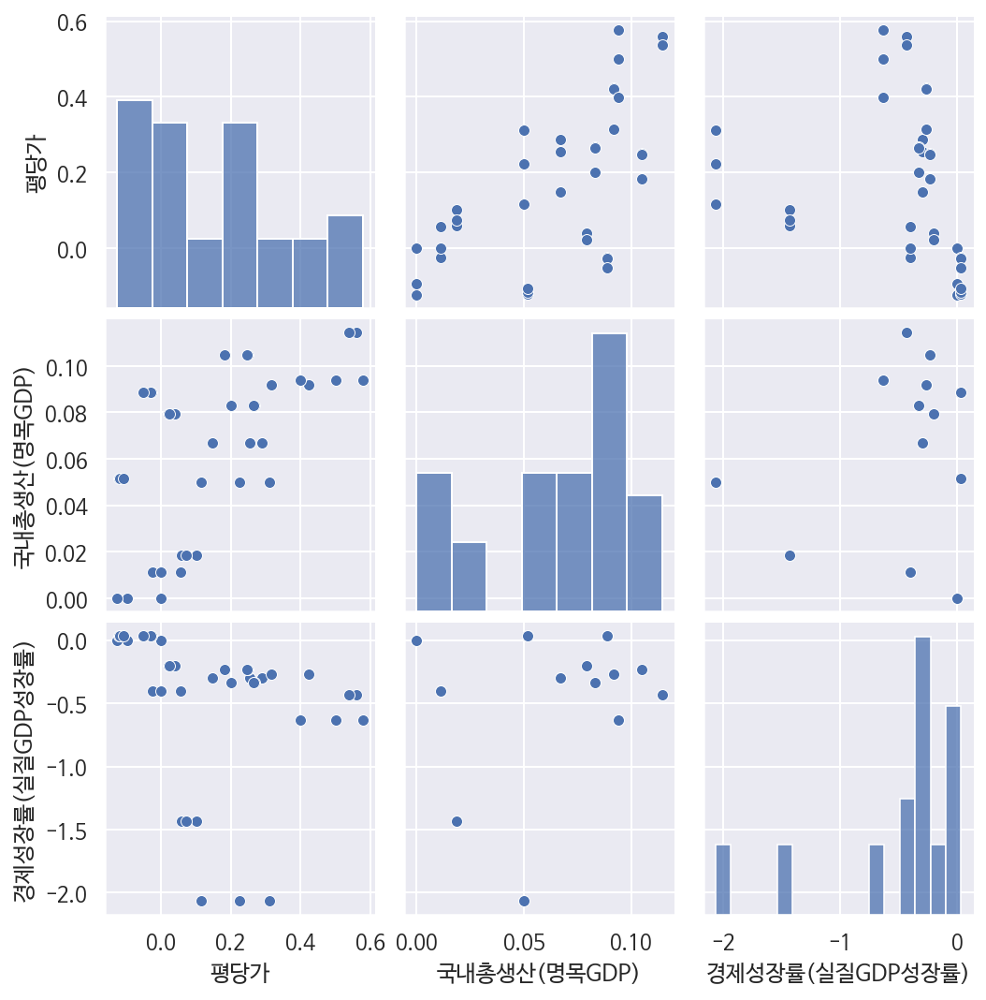

In [ ]:
plt.figure(figsize=(10,10))
sns.pairplot(pd.concat([df_norm.평당가, df_norm.iloc[:, -4:-2]], axis=1));

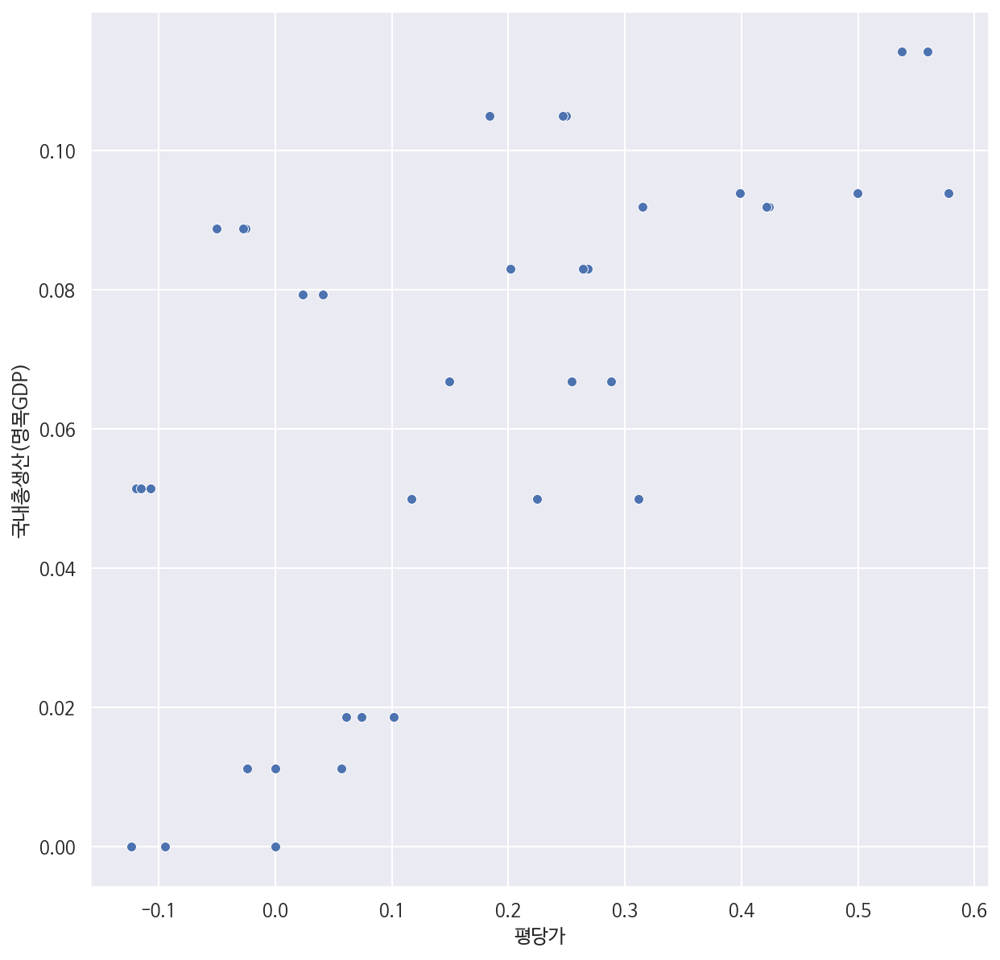

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(data=df_norm, x="평당가", y="국내총생산(명목GDP)");

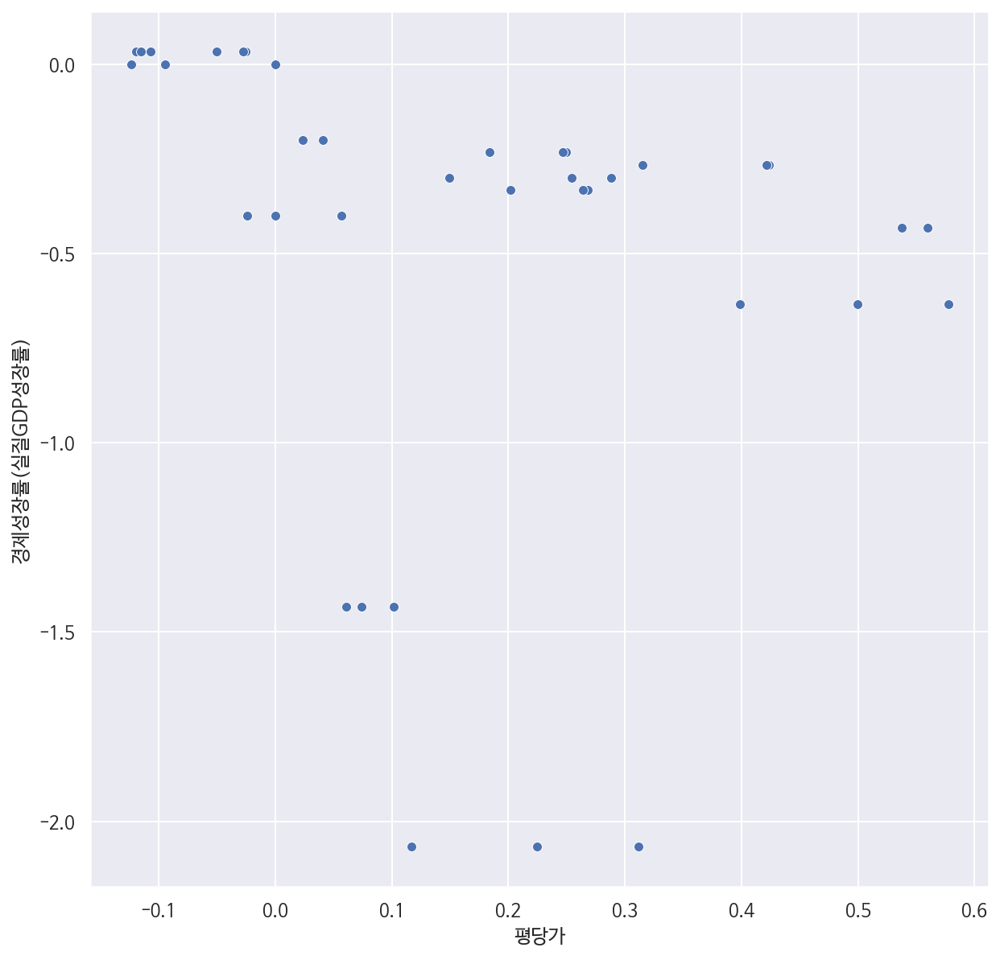

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(data=df_norm, x="평당가", y="경제성장률(실질GDP성장률)");

In [ ]:
chi_test('평당가', "국내총생산(명목GDP)")
chi_test('평당가', '경제성장률(실질GDP성장률)')

pvalue : 0.270
pvalue가 0.05보다 크므로 월별 평당가 평균과 국내총생산(명목GDP)간에는 연관이 없다.
pvalue : 0.250
pvalue가 0.05보다 크므로 월별 평당가 평균과 경제성장률(실질GDP성장률)간에는 연관이 없다.


## 외국인투자

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(data=df_norm, x="평당가", y="외국인증권투자");

# Pipeline

In [ ]:
dataset = df.drop(columns=['거래횟수','평당가','지번','-\xa0집세'])

In [ ]:
def engine(xxx):
  xxx['KRX'] = xxx.KS11 + xxx.KQ11
  xxx = xxx.drop(columns=['KS11','KQ11'])
  return xxx

DF_1 = engine(dataset.copy())
DF_1.shape

(249742, 42)

In [ ]:
dataset = DF_1

In [ ]:
target='거래금액'
train = dataset[(dataset.거래년월 != '2021-01') | (dataset.거래년월 != '2021-02')].copy()
test = dataset[(dataset.거래년월 == '2021-01') | (dataset.거래년월 == '2021-02')].copy()
print(train.shape,test.shape)
print(test.거래년월.value_counts())

(249742, 42) (9515, 42)
2021-01    5657
2021-02    3858
Name: 거래년월, dtype: int64


In [ ]:
X = train.drop(columns=target)
y = train[target]
X_test = test.drop(columns=target)
y_test = test[target]
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
!pip install category_encoders

     |████████████████████████████████| 80 kB 7.0 MB/s 


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import make_pipeline
from category_encoders import OrdinalEncoder

## Linear

In [ ]:
from sklearn.linear_model import LinearRegression
pipe = make_pipeline(
    OrdinalEncoder(), 
    LinearRegression()
)

pipe.fit(X_train, y_train)
print('훈련 R^2: ', pipe.score(X_train, y_train))
print('검증 R^2: ', pipe.score(X_val, y_val))
print('TEST R^2: ', pipe.score(X_test, y_test))

print('\n훈련 MAE: ', mean_absolute_error(pipe.predict(X_train), y_train))
print('검증 MAE: ', mean_absolute_error(pipe.predict(X_val), y_val))
print('TEST MAE: ', mean_absolute_error(pipe.predict(X_test), y_test))

훈련 R^2:  0.5484166837756287
검증 R^2:  0.5478939205172781
TEST R^2:  0.5626088973035539

훈련 MAE:  24823.01763773863
검증 MAE:  24629.34099114177
TEST MAE:  29947.358684885883


## RandomForest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
pipe = make_pipeline(
    OrdinalEncoder(), 
    RandomForestRegressor(n_jobs=-1)
)

pipe.fit(X_train, y_train)
print('훈련 R^2: ', pipe.score(X_train, y_train))
print('검증 R^2: ', pipe.score(X_val, y_val))
print('TEST R^2: ', pipe.score(X_test, y_test))

print('\n훈련 MAE: ', mean_absolute_error(pipe.predict(X_train), y_train))
print('검증 MAE: ', mean_absolute_error(pipe.predict(X_val), y_val))
print('TEST MAE: ', mean_absolute_error(pipe.predict(X_test), y_test))

훈련 R^2:  0.9961667023961294
검증 R^2:  0.9702631906776191
TEST R^2:  0.9890099310907005

훈련 MAE:  1811.2364822534862
검증 MAE:  4799.823183620317
TEST MAE:  3739.8538554467814


## XGBBoost

In [ ]:
from xgboost.sklearn import XGBModel
from xgboost import XGBRegressor
pipe = make_pipeline(
    OrdinalEncoder(), 
    XGBRegressor(n_jobs=-1)
)

pipe.fit(X_train, y_train)
print('훈련 R^2: ', pipe.score(X_train, y_train))
print('검증 R^2: ', pipe.score(X_val, y_val))
print('TEST R^2: ', pipe.score(X_test, y_test))

print('\n훈련 MAE: ', mean_absolute_error(pipe.predict(X_train), y_train))
print('검증 MAE: ', mean_absolute_error(pipe.predict(X_val), y_val))
print('TEST MAE: ', mean_absolute_error(pipe.predict(X_test), y_test))

[10:06:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
훈련 R^2:  0.8519354473558287
검증 R^2:  0.8464636121045298
TEST R^2:  0.8306166777297027

훈련 MAE:  14154.054328034554
검증 MAE:  14110.589856135986
TEST MAE:  19214.03827214765


## LGBM

In [ ]:
from lightgbm import LGBMRegressor
pipe = make_pipeline(
    OrdinalEncoder(), 
    LGBMRegressor(n_jobs=-1)
)

pipe.fit(X_train, y_train)
print('훈련 R^2: ', pipe.score(X_train, y_train))
print('검증 R^2: ', pipe.score(X_val, y_val))
print('TEST R^2: ', pipe.score(X_test, y_test))

print('\n훈련 MAE: ', mean_absolute_error(pipe.predict(X_train), y_train))
print('검증 MAE: ', mean_absolute_error(pipe.predict(X_val), y_val))
print('TEST MAE: ', mean_absolute_error(pipe.predict(X_test), y_test))

훈련 R^2:  0.9328950248567084
검증 R^2:  0.9259017762984202
TEST R^2:  0.9208440063950041

훈련 MAE:  9736.883549209853
검증 MAE:  9883.036319145815
TEST MAE:  13852.281801619185


## RandomizedSearchCV with LGBM

In [ ]:
encoder = OrdinalEncoder()
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)
X_test_encoded = encoder.transform(X_test)
X_encoded = encoder.transform(X)

In [ ]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
from sklearn.model_selection import RandomizedSearchCV
fit_params={"early_stopping_rounds":50, 
            "eval_metric" : 'mae', 
            "eval_set" : [(X_train_encoded, y_train),
                          (X_val_encoded, y_val)],
            'verbose': 100}

param_test ={'max_depth':[-1,-5,5,7,9,11,13,15,17,19,21,23,30,50,100,150],
             'reg_alpha': [0, 1, 2, 5, 10, 50, 100],
             'reg_lambda': [0, 1, 5,20, 50, 100],
             'subsample':[None,0.7]}
lgbm = LGBMRegressor(random_state=42,learning_rate=0.1, n_estimators=300000, n_jobs=-1)


rs = RandomizedSearchCV(
    estimator=lgbm, 
    param_distributions=param_test, 
    n_iter=100,
    scoring='neg_mean_absolute_error',
    cv=3,
    random_state=1,
    verbose=3)


rs.fit(X_train_encoded, y_train, **fit_params)

In [ ]:
pd.DataFrame(rs.cv_results_)

In [ ]:
from lightgbm import LGBMRegressor
lightgbm = LGBMRegressor(learning_rate=0.01, max_depth=15, n_estimators=300000, 
                         num_leaves=250, reg_alpha=1, reg_lambda=1, subsample=0.7,
                         random_state=42, n_jobs=-1)

fit_params={"early_stopping_rounds":50, 
            "eval_metric" : 'mae', 
            "eval_set" : [(X_train_encoded, y_train),
                          (X_val_encoded, y_val)],
            'verbose': 100}
            
lightgbm.fit(X_train_encoded, y_train,**fit_params)
print('훈련 R^2: ', lightgbm.score(X_train_encoded, y_train))
print('검증 R^2: ', lightgbm.score(X_val_encoded, y_val))
print('TEST R^2: ', lightgbm.score(X_test_encoded, y_test))

print('\n훈련 MAE: ', mean_absolute_error(lightgbm.predict(X_train_encoded), y_train))
print('검증 MAE: ', mean_absolute_error(lightgbm.predict(X_val_encoded), y_val))
print('TEST MAE: ', mean_absolute_error(lightgbm.predict(X_test_encoded), y_test))

Training until validation scores don't improve for 50 rounds.
[100]	training's l1: 18535.2	training's l2: 6.97299e+08	valid_1's l1: 18450	valid_1's l2: 6.98536e+08
[200]	training's l1: 11911.5	training's l2: 2.81455e+08	valid_1's l1: 12062.1	valid_1's l2: 3.03766e+08
[300]	training's l1: 9307.17	training's l2: 1.78138e+08	valid_1's l1: 9602.27	valid_1's l2: 2.06695e+08
[400]	training's l1: 7979.85	training's l2: 1.35871e+08	valid_1's l1: 8348.74	valid_1's l2: 1.66866e+08
[500]	training's l1: 7216.84	training's l2: 1.13761e+08	valid_1's l1: 7641.21	valid_1's l2: 1.468e+08
[600]	training's l1: 6739.02	training's l2: 1.01135e+08	valid_1's l1: 7203.46	valid_1's l2: 1.35602e+08
[700]	training's l1: 6312.1	training's l2: 9.06459e+07	valid_1's l1: 6804.66	valid_1's l2: 1.25736e+08
[800]	training's l1: 5989.7	training's l2: 8.29173e+07	valid_1's l1: 6511.82	valid_1's l2: 1.18581e+08
[900]	training's l1: 5727.56	training's l2: 7.6556e+07	valid_1's l1: 6278.75	valid_1's l2: 1.12888e+08
[1000]	tr

## Evaluation

In [ ]:
y_test_lg = lightgbm.predict(X_test_encoded)

In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score

print('LGB MAE: ', mean_absolute_error(y_test_lg, y_test))
print('LGB R2: ', r2_score(y_test_lg, y_test))

LGB MAE:  3854.306606258702
LGB R2:  0.9907803374882104


# XAI

## 예측 금액 및 차이

In [ ]:
df_pred = pd.DataFrame(y_test)
df_pred = df_pred.reset_index(drop=True)
df_pred['예측금액'] = y_test_lg
df_pred['차이'] = df_pred['거래금액'] - df_pred['예측금액']
df_pred['차이(%)'] = df_pred['차이']/df_pred['거래금액']*100
df_pred[['지역코드', '법정동', '아파트', '전용면적', '층', '건축년도', '거래년월']] = X_test.reset_index()[['지역코드', '법정동', '아파트', '전용면적', '층', '건축년도', '거래년월']]
df_pred['count'] = [1]*len(y_test_lg)
df_pred

,거래금액,예측금액,차이,차이(%),지역코드,법정동,아파트,전용면적,층,건축년도,거래년월,count
0,127000,135879.439583,-8879.439583,-6.991685,종로구,견지동,대성스카이렉스,149.800,11,2008,2021-01,1
1,114000,112596.957867,1403.042133,1.230739,종로구,교북동,경희궁자이(4단지),45.879,17,2017,2021-01,1
2,175000,175897.993852,-897.993852,-0.513139,종로구,내수동,경희궁의아침2단지,174.550,4,2004,2021-01,1
3,175000,175897.993852,-897.993852,-0.513139,종로구,내수동,경희궁의아침2단지,174.550,4,2004,2021-01,1
4,180000,177470.374623,2529.625377,1.405347,종로구,내수동,경희궁의아침3단지,123.130,13,2004,2021-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9510,70000,69964.566781,35.433219,0.050619,송파구,풍납동,현대리버빌1지구,43.200,5,1999,2021-02,1
9511,65000,68299.048880,-3299.048880,-5.075460,송파구,풍납동,현대리버빌2지구,40.950,16,1999,2021-02,1
9512,59000,56308.003854,2691.996146,4.562705,송파구,풍납동,현대리버빌2지구,40.950,1,1999,2021-02,1
9513,132000,129735.371110,2264.628890,1.715628,송파구,풍납동,쌍용,84.860,18,1994,2021-02,1


## 구별 예측금액과 실제금액의 차이

In [ ]:
pd.concat([df_pred.groupby('지역코드').mean().drop(columns='count'),df_pred.groupby('지역코드').sum()['count']],axis=1)

,거래금액,예측금액,차이,차이(%),전용면적,층,건축년도,count
지역코드,,,,,,,,
강남구,196048.885382,195455.106445,593.778937,-1.082843,90.323156,9.267442,1998.865449,602
강북구,59176.134454,59656.291761,-480.157308,-1.211089,66.435879,7.915966,2003.873950,238
강서구,75251.450253,74993.945338,257.504915,-1.011713,68.979580,7.613828,2001.991568,593
관악구,74370.851735,74887.141632,-516.289897,-1.855843,73.526498,9.605678,2002.182965,317
광진구,122262.849162,122490.659754,-227.810592,-1.170524,80.441860,10.346369,1999.675978,179
구로구,61143.045620,60896.832487,246.213133,-1.084709,67.410622,9.217153,1999.315693,548
금천구,59263.711340,59932.739777,-669.028437,-2.302764,68.158349,11.278351,2003.283505,194
노원구,63472.474747,63401.638024,70.836723,-0.593524,62.748235,8.089899,1994.033333,990
도봉구,55686.179541,55762.223802,-76.044262,-1.304987,68.360003,7.764092,1995.250522,479


## 예측 오차 PLOT

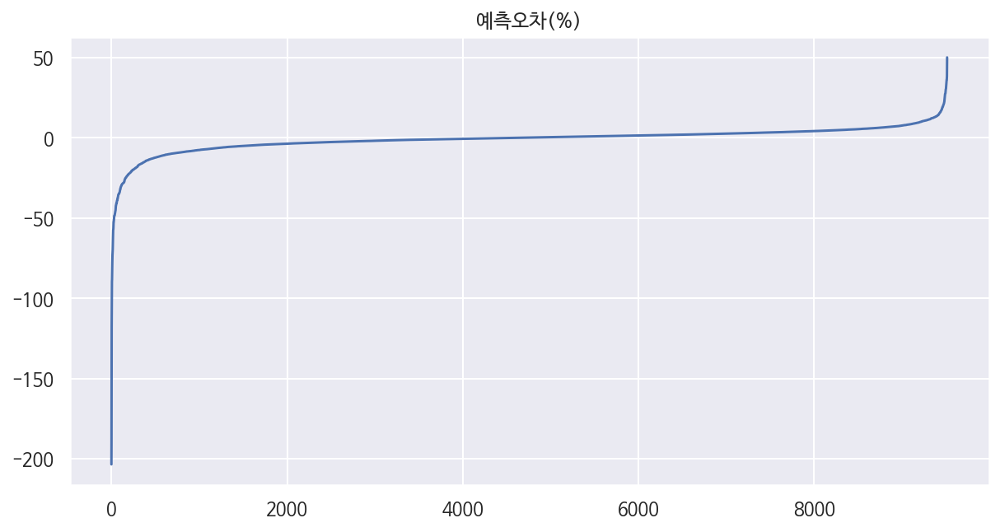

In [ ]:
plt.figure(figsize=(10,5))
plt.title('예측오차(%)')
df_pred.sort_values(by='차이(%)').reset_index()['차이(%)'].plot()
plt.show();

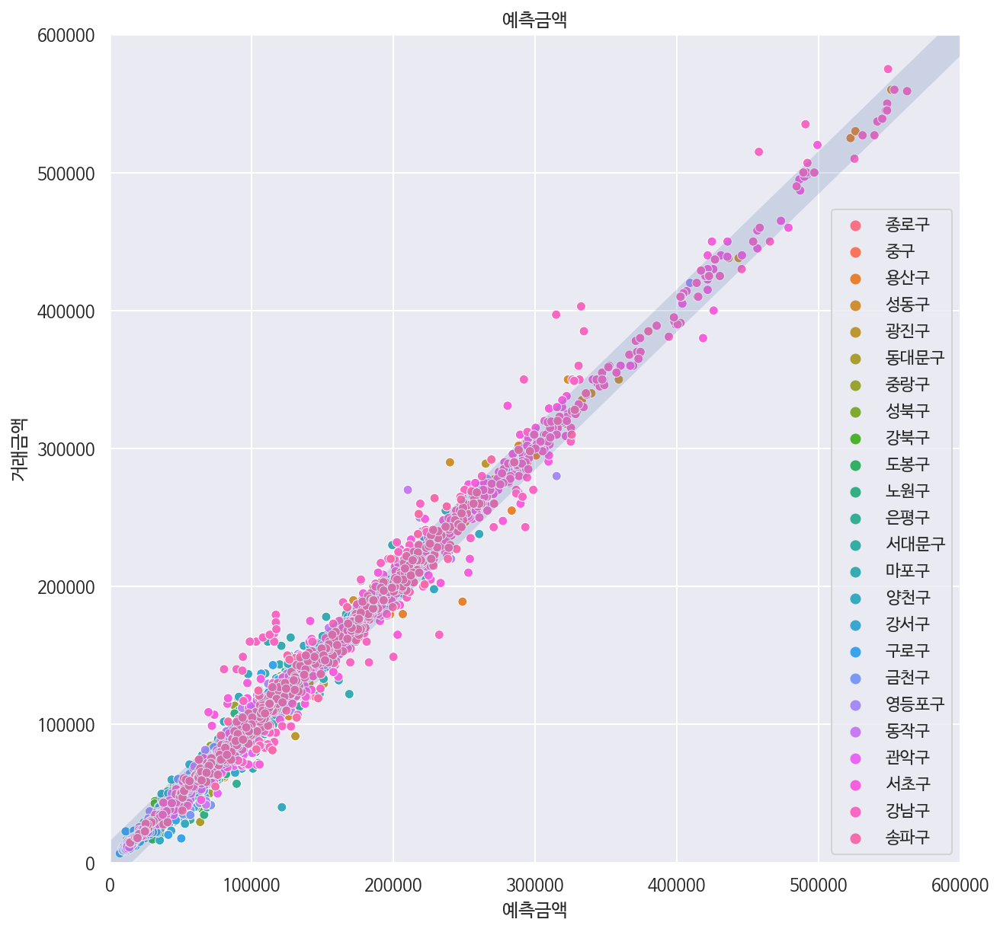

In [ ]:
plt.figure(figsize=(10,10))
plt.title('예측금액')
plt.xlim(0,600000)
plt.ylim(0,600000)
sns.scatterplot(df_pred.예측금액, df_pred.거래금액, hue=df_pred.지역코드)
sns.lineplot((0,600000),(0,600000),linewidth=20,color='b',alpha=0.2)
plt.show()

In [ ]:
import plotly.express as px

fig = px.scatter(df_pred, x="예측금액", y="거래금액",color="지역코드")
fig.update_layout(
    autosize=False,
    width=950,
    height=800,)
fig.show()

## Feature Importance

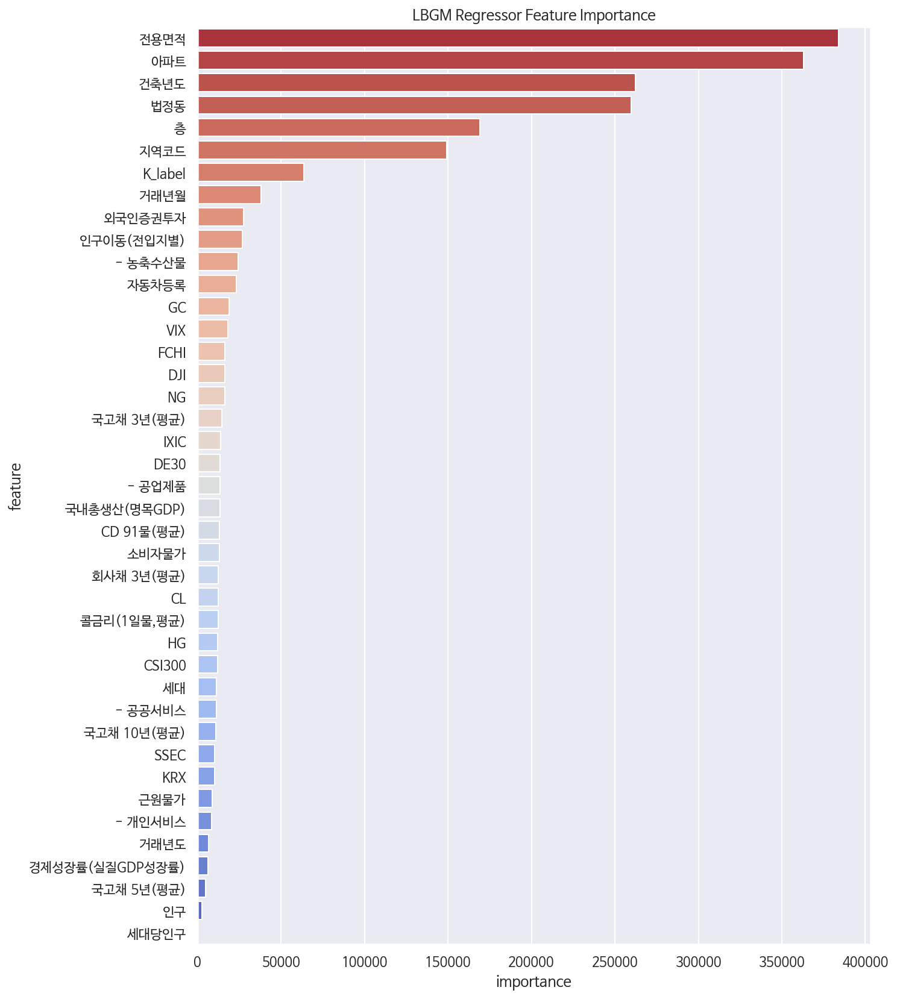

In [ ]:
visvis = [[aa,bb] for aa,bb in zip(X_test.columns,lightgbm.feature_importances_)]
df_visivs = pd.DataFrame(visvis,columns=['feature','importance']).sort_values('importance',ascending=False)
plt.figure(figsize=(10,14))
plt.title('LBGM Regressor Feature Importance')
sns.barplot(df_visivs.importance,df_visivs.feature,orient='h',palette='coolwarm_r');

## ELI5 

In [ ]:
!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance

     |████████████████████████████████| 106 kB 14.7 MB/s 


In [ ]:
permuter = PermutationImportance(lightgbm,
                                 n_iter=5,
                                 random_state=1
)

permuter.fit(X_test_encoded, y_test);

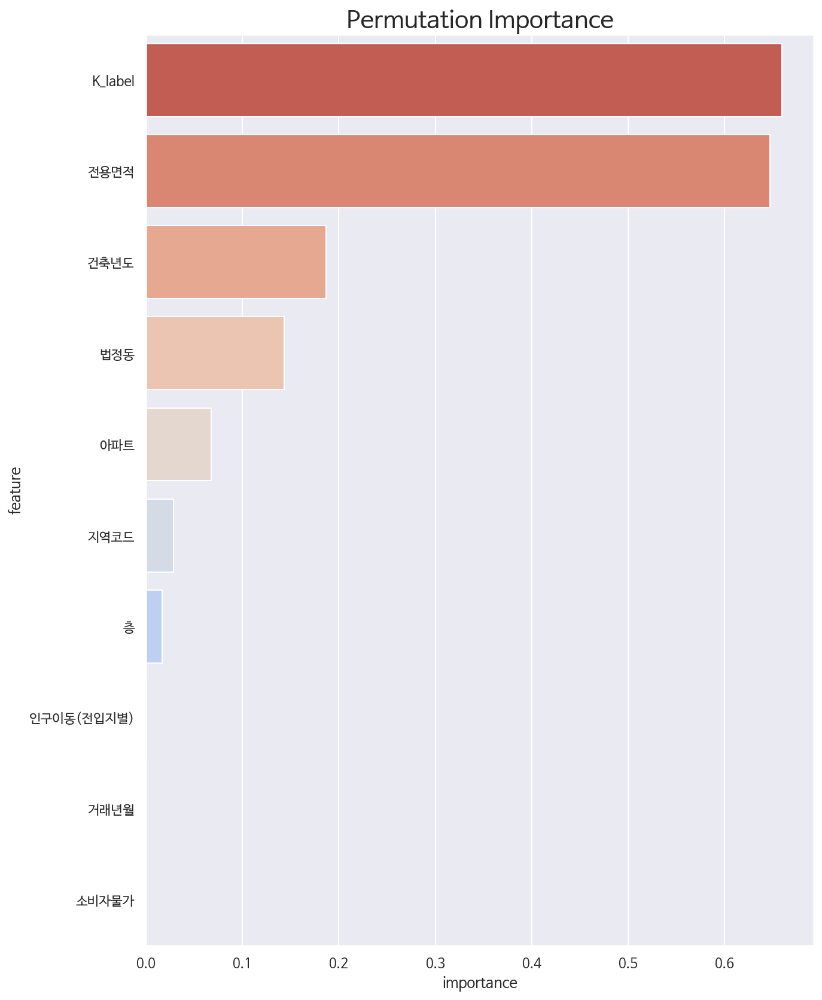

In [ ]:
plt.figure(figsize=(10,14))
zipp  = []
for zipper in zip(X_train.columns, permuter.feature_importances_):
  zipp.append(zipper)
zipp = pd.DataFrame(zipp,columns=['feature','importance']).sort_values('importance',ascending=False)
sns.barplot(y = zipp.feature[:10], x= zipp.importance[:10], palette='coolwarm_r')
plt.title("Permutation Importance",fontsize=20)
plt.show()

## SHAP

In [ ]:
!pip install shap

     |████████████████████████████████| 356 kB 16.0 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491644 sha256=9d797103bc554083f0de166b3688a7a87a948a141fdf6642e45b32ca75b6dd6e
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap


In [ ]:
import shap
explainer = shap.TreeExplainer(lightgbm, data=shap.sample(X_test_encoded, 100), feature_perturbation='interventional')

In [ ]:
shap.initjs()
shap.force_plot(
  base_value=explainer.expected_value, 
  shap_values=explainer.shap_values(X_test_encoded.iloc[100]),
  features=X_test_encoded.columns
)

In [ ]:
shap.initjs()
shap.force_plot(
  base_value=explainer.expected_value, 
  shap_values=explainer.shap_values(X_test_encoded.iloc[9000]),
  features=X_test_encoded.columns
)

In [ ]:
shap.initjs()
shap.force_plot(
  base_value=explainer.expected_value, 
  shap_values=explainer.shap_values(X_test_encoded.iloc[365]),
  features=X_test_encoded.columns
)